# 데이터셋 불러오기

In [237]:
# IMA이미지를 불러오는 라이브러리
import pydicom

import numpy as np
import torch
import torchvision.transforms as transforms
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.figsize'] = [3.0, 3.0]
import seaborn as sns
import torch.nn as nn

In [238]:
import glob

L_list = glob.glob('/root/Mayo2016/*')
L_list = [path.split('/')[-1] for path in L_list]
L_list.sort()
L_list

['L067',
 'L096',
 'L109',
 'L143',
 'L192',
 'L286',
 'L291',
 'L310',
 'L333',
 'L506']

In [239]:
data_label = ['quarter_1mm', 'full_1mm']

In [240]:
def normlize(path):
  dicom_data = pydicom.dcmread(path)
  img = dicom_data.pixel_array.astype(np.float32) * dicom_data.RescaleSlope + dicom_data.RescaleIntercept
  mu, sd = (-500,500)
  scaled_img = (img - mu) / sd
  img = np.expand_dims(scaled_img, axis=0)

  return img # 1x512x512

In [241]:
def extract_patches(img, patch_size=55, interval=55):
  patches = []
  _, height, width = img.shape
  for y in range(0, height - patch_size + 1, interval):
    for x in range(0, width - patch_size + 1, interval):
      patch = img[:, y:y + patch_size, x:x + patch_size]
      patches.append(patch)
  patches = np.array(patches)
  return patches # patch수x1x55x55

In [242]:
import random
from scipy.ndimage import rotate, zoom

def augment_patches(X_patches, y_patches, p=0.5):
    X_augmented_patches, y_augmented_patches = [], []
    
    # random이 들어가기에, X랑 y를 동시에 넣어준다.
    for i, (X_patch, y_patch) in enumerate(zip(X_patches, y_patches)):
        # 원본 패치 추가
        X_augmented_patches.append(X_patch)
        y_augmented_patches.append(y_patch)

        if random.random() < p:
            # 1. 90, 270으로 돌려보자.(뒤집기랑 조금 다르긴 하지만, 점대칭 vs 선대칭, 그냥 +-90도만 쓰자.)
            X, y = rotate(X_patch, 90, axes=(1, 2), reshape=False), rotate(y_patch, 90, axes=(1, 2), reshape=False)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
            X, y = rotate(X_patch, -90, axes=(1, 2), reshape=False), rotate(y_patch, -90, axes=(1, 2), reshape=False)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
        if random.random() < p:
            # 2. 수직 뒤집기
            X,y = np.flip(X_patch, axis=1),np.flip(y_patch, axis=1)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
        if random.random() < p:
            # 3. 수평 뒤집기
            X,y = np.flip(X_patch, axis=2),np.flip(y_patch, axis=2)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)

    return np.array(X_augmented_patches), np.array(y_augmented_patches)

In [243]:
def patch_maker_W_aug(X_dir, y_dir):
  X_img, y_img = normlize(X_dir), normlize(y_dir)
  X_patches = extract_patches(img=X_img, patch_size=55, interval=55)
  y_patches = extract_patches(img=y_img, patch_size=55, interval=55)
  X_augmented_patches, y_augmented_patches = augment_patches(X_patches, y_patches, p=0.5)
  return X_augmented_patches, y_augmented_patches

In [244]:
def patch_maker_WO_aug(X_dir, y_dir):
  X_img, y_img = normlize(X_dir), normlize(y_dir)
  X_patches = extract_patches(img=X_img, patch_size=55, interval=55)
  y_patches = extract_patches(img=y_img, patch_size=55, interval=55)
  return X_patches, y_patches

In [245]:
import os
from torch.utils.data import Dataset
import torch
import glob
from tqdm import tqdm

class CustomDataset(Dataset):
    def __init__(self, data_type, patch_maker, L_list):
        self.data_type = data_type
        self.patch_maker = patch_maker
        self.L_list = L_list
        self.image_pairs = []

        X_dir_list, y_dir_list = [], []
        for L in self.L_list:
            X_dir, y_dir = self.get_data_range(L)
            X_dir_list += X_dir
            y_dir_list += y_dir

        for X_dir, y_dir in tqdm(zip(X_dir_list, y_dir_list), total=len(X_dir_list), desc=f"{self.data_type} is processing"):
            X_patches, y_patches = self.patch_maker(X_dir, y_dir)
            for i in range(X_patches.shape[0]):
                X_patch, y_patch = torch.from_numpy(X_patches[i]), torch.from_numpy(y_patches[i]) # torch로 넣어주자.
                self.image_pairs.append((X_patch, y_patch))

    def get_data_range(self, L):
        """슬라이싱 범위를 설정하는 함수"""
        X_dir = sorted(glob.glob(f'/root/Mayo2016/{L}/{data_label[0]}/*.IMA'))
        y_dir = sorted(glob.glob(f'/root/Mayo2016/{L}/{data_label[1]}/*.IMA'))
        n1, n2 = len(X_dir), len(y_dir)
        
        if self.data_type == 'train':
            X_range = X_dir[:int(n1 * 0.64)]
            y_range = y_dir[:int(n2 * 0.64)]
        elif self.data_type == 'val':
            X_range = X_dir[int(n1 * 0.64):int(n1 * 0.8)]
            y_range = y_dir[int(n2 * 0.64):int(n2 * 0.8)]
        else:  # test
            X_range = X_dir[int(n1 * 0.8):]
            y_range = y_dir[int(n2 * 0.8):]

        return X_range, y_range

    def __len__(self):
        return len(self.image_pairs)

    def __getitem__(self, idx):
        X = self.image_pairs[idx][0]
        y = self.image_pairs[idx][1]
        return X, y

In [246]:
# 파일 경로 설정

root = '/root/code/'
train_path = root+'train_dataset.pt'
val_path = root+'val_dataset.pt'
test_path = root+'test_dataset.pt'

In [247]:
# 4분 정도 소요

# 데이터셋 불러오기
train_dataset = torch.load(train_path)
val_dataset = torch.load(val_path)
test_dataset = torch.load(test_path) # 45초

In [248]:
batch_size = 16
from torch.utils.data import DataLoader
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

In [249]:
len(train_loader), len(val_loader), len(test_loader)

(57596, 4815, 6025)

# attention모델1 (SEBlock); Channel Attention

attention을 encoder의 2,4번쨰 conv block 뒤에 설치

In [250]:
class SEBlock(nn.Module):
    def __init__(self, channels, reduction=16):
        super(SEBlock, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channels, channels // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channels // reduction, channels, bias=False),
            nn.Sigmoid()
        )
        self.last_attention = None  # 저장된 Attention 값을 위한 변수

    def forward(self, x):
        batch, channels, _, _ = x.size()
        # 채널별 전역 평균 풀링
        y = self.avg_pool(x).view(batch, channels)
        y = self.fc(y).view(batch, channels, 1, 1)
        self.last_attention = y  # 계산된 Attention Weight 저장
        return x * y


In [251]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [252]:
import torch
import torch.nn as nn
import torch.nn.functional as F


# UNet with Selective Channel Attention
class UNetWithChannelAttention(nn.Module):
    def __init__(self, in_channels=1, out_channels=1, features=[64, 128, 256, 512], reduction=16):
        super(UNetWithChannelAttention, self).__init__()

        self.encoder = nn.ModuleList()
        self.decoder = nn.ModuleList()
        self.attention_blocks = nn.ModuleList()

        # Encoder Path
        for idx, feature in enumerate(features):
            self.encoder.append(self.conv_block(in_channels, feature))
            if idx in [1, 3]:  # Attention 적용 위치
                self.attention_blocks.append(SEBlock(feature, reduction=reduction))
            else:
                self.attention_blocks.append(nn.Identity())  # Placeholder로 nn.Identity 사용
            in_channels = feature

        # Bottleneck
        self.bottleneck = self.conv_block(features[-1], features[-1] * 2)

        # Decoder Path
        for feature in reversed(features):
            self.decoder.append(nn.ConvTranspose2d(feature * 2, feature, kernel_size=2, stride=2))
            self.decoder.append(self.conv_block(feature * 2, feature))

        # Final Convolution
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x):
        enc_outputs = []

        # Encoder Path
        for idx, layer in enumerate(self.encoder):
            x = layer(x)
            x = self.attention_blocks[idx](x)  # Attention 적용
            enc_outputs.append(x)
            x = F.max_pool2d(x, kernel_size=2, stride=2)

        # Bottleneck
        x = self.bottleneck(x)

        # Decoder Path
        for idx in range(0, len(self.decoder), 2):
            x = self.decoder[idx](x)  # Upsample
            enc_output = enc_outputs[-(idx // 2) - 1]  # Skip connection
            x = F.interpolate(x, size=enc_output.shape[2:], mode='bilinear', align_corners=False)
            x = torch.cat((enc_output, x), dim=1)  # Concatenate
            x = self.decoder[idx + 1](x)  # Convolution after concatenation

        return self.final_conv(x)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )


In [253]:
model = UNetWithChannelAttention().to(device)
model

UNetWithChannelAttention(
  (encoder): ModuleList(
    (0): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

In [254]:
%cd /root/code

import utils.EarlyStopping
import utils.LRScheduler
import utils.train_eval_util
import importlib
importlib.reload(utils.EarlyStopping)
importlib.reload(utils.LRScheduler)
importlib.reload(utils.train_eval_util)

/root/code


<module 'utils.train_eval_util' from '/root/code/utils/train_eval_util.py'>

In [255]:
import torch.nn as nn
criterion = nn.MSELoss()

from utils.EarlyStopping import *
from utils.LRScheduler import *
from utils.train_eval_util import train, evaluate

learning_rate = 1e-5
optimizer = torch.optim.Adam(params = model.parameters(),
                             lr = learning_rate)


early_stopping = EarlyStopping(patience = 7, # 7번까지는 개선이 안되어도 봐준다.
                               min_delta = 1e-5) # 이정도는 개선이 되어야한다. 아니면 위의 patience까지 count하다가 stop


scheduler = LRScheduler(optimizer = optimizer,
                        patience = 5,
                        min_lr = 1e-10,
                        factor = 0.5)

In [256]:
import torch
from tqdm import tqdm

interval = 1000

def train(model, train_loader, optimizer, criterion, device, epoch):
    model.train()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    for i, data in tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch} - Training"):
        X, y = data[0].to(device), data[1].to(device)
        optimizer.zero_grad()
        X_hat = model(X)
        loss = criterion(X_hat, y)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(train_loader.dataset)

def evaluate(model, loader, criterion, device, epoch):
    model.eval()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    with torch.no_grad():
        for i, data in tqdm(enumerate(loader), total=len(loader), desc=f"Epoch {epoch} - Evaluating"):
            X, y = data[0].to(device), data[1].to(device)
            X_hat = model(X)
            loss = criterion(X_hat, y)

            running_loss += loss.item() * X.size(0)

            if i % interval == interval-1:
                interval_loss = running_loss / interval
                loss_list.append(interval_loss)
                total_loss += running_loss
                running_loss = 0.0
                tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(loader.dataset)

# 학습

In [257]:
!pwd

/root/code


In [258]:
%cd /root/code/unet/attention_channel

/root/code/unet/attention_channel


In [259]:
epochs = 2 # 각 epoch마다 train(20분), valid(2분)이 소요된다.
best_valid_loss = float('inf')
train_loss_per_iter = []
train_loss_per_epoch = []
val_loss_per_iter = []
val_loss_per_epoch = []

for epoch in range(epochs):
    loss_list, total_loss = train(model, train_loader, optimizer, criterion, device, epoch)
    train_loss_per_iter.append(loss_list)
    train_loss_per_epoch.append(total_loss)

    loss_list, total_loss = evaluate(model, val_loader, criterion, device, epoch)
    val_loss_per_iter.append(loss_list)
    val_loss_per_epoch.append(total_loss)

    print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss_per_epoch[-1]:.4f}, Valid Loss: {val_loss_per_epoch[-1]:.4f}")

    valid_loss = val_loss_per_epoch[-1]
    scheduler(valid_loss)

    if (early_stopping(valid_loss)):
        break

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        epochs_no_improve = 0
        torch.save(model.state_dict(), "./" + 'unet_C_A' + ".pth")

Epoch 0 - Training:   2%|▏         | 1003/57596 [00:30<28:04, 33.59it/s]

train loss : 1.264467549741268


Epoch 0 - Training:   3%|▎         | 2003/57596 [01:00<27:42, 33.43it/s]

train loss : 0.22670582029223443


Epoch 0 - Training:   5%|▌         | 3003/57596 [01:30<27:13, 33.41it/s]

train loss : 0.1591785000488162


Epoch 0 - Training:   7%|▋         | 4003/57596 [02:00<26:44, 33.40it/s]

train loss : 0.10327195893973112


Epoch 0 - Training:   9%|▊         | 5003/57596 [02:29<26:16, 33.36it/s]

train loss : 0.09208788824453949


Epoch 0 - Training:  10%|█         | 6006/57596 [03:00<25:34, 33.62it/s]

train loss : 0.10374229250475764


Epoch 0 - Training:  12%|█▏        | 7006/57596 [03:30<25:10, 33.49it/s]

train loss : 0.08632974496483803


Epoch 0 - Training:  14%|█▍        | 8006/57596 [04:00<25:34, 32.32it/s]

train loss : 0.07121699855476618


Epoch 0 - Training:  16%|█▌        | 9005/57596 [04:31<24:03, 33.66it/s]

train loss : 0.06665354378893971


Epoch 0 - Training:  17%|█▋        | 10005/57596 [05:01<25:57, 30.56it/s]

train loss : 0.06243544297851622


Epoch 0 - Training:  19%|█▉        | 11005/57596 [05:32<23:09, 33.52it/s]

train loss : 0.06090563087910414


Epoch 0 - Training:  21%|██        | 12005/57596 [06:02<24:19, 31.24it/s]

train loss : 0.06721466667763888


Epoch 0 - Training:  23%|██▎       | 13005/57596 [06:33<24:07, 30.81it/s]

train loss : 0.060398206723853945


Epoch 0 - Training:  24%|██▍       | 14005/57596 [07:03<21:42, 33.48it/s]

train loss : 0.05737850030325353


Epoch 0 - Training:  26%|██▌       | 15003/57596 [07:33<21:25, 33.14it/s]

train loss : 0.05621512678079307


Epoch 0 - Training:  28%|██▊       | 16003/57596 [08:03<22:26, 30.88it/s]

train loss : 0.06345111470110715


Epoch 0 - Training:  30%|██▉       | 17003/57596 [08:34<23:31, 28.76it/s]

train loss : 0.054373770328238605


Epoch 0 - Training:  31%|███▏      | 18006/57596 [09:06<19:47, 33.35it/s]

train loss : 0.055125653674826025


Epoch 0 - Training:  33%|███▎      | 19006/57596 [09:35<19:14, 33.43it/s]

train loss : 0.05209365446679294


Epoch 0 - Training:  35%|███▍      | 20006/57596 [10:06<18:51, 33.23it/s]

train loss : 0.05014881755039096


Epoch 0 - Training:  36%|███▋      | 21004/57596 [10:36<18:15, 33.39it/s]

train loss : 0.05174239632859826


Epoch 0 - Training:  38%|███▊      | 22004/57596 [11:06<17:38, 33.64it/s]

train loss : 0.05261513997428119


Epoch 0 - Training:  40%|███▉      | 23005/57596 [11:37<18:32, 31.08it/s]

train loss : 0.049996855519711975


Epoch 0 - Training:  42%|████▏     | 24005/57596 [12:07<16:47, 33.34it/s]

train loss : 0.04991409214027226


Epoch 0 - Training:  43%|████▎     | 25004/57596 [12:37<16:59, 31.97it/s]

train loss : 0.05556022329442203


Epoch 0 - Training:  45%|████▌     | 26006/57596 [13:07<15:43, 33.47it/s]

train loss : 0.05088392847590149


Epoch 0 - Training:  47%|████▋     | 27006/57596 [13:37<15:24, 33.08it/s]

train loss : 0.04917315100133419


Epoch 0 - Training:  49%|████▊     | 28005/57596 [14:09<16:59, 29.03it/s]

train loss : 0.05194100636616349


Epoch 0 - Training:  50%|█████     | 29006/57596 [14:39<14:44, 32.34it/s]

train loss : 0.05035928686335683


Epoch 0 - Training:  52%|█████▏    | 30006/57596 [15:09<13:48, 33.30it/s]

train loss : 0.046086212346330285


Epoch 0 - Training:  54%|█████▍    | 31004/57596 [15:39<13:17, 33.35it/s]

train loss : 0.049969993360340595


Epoch 0 - Training:  56%|█████▌    | 32004/57596 [16:09<12:47, 33.34it/s]

train loss : 0.0462021400295198


Epoch 0 - Training:  57%|█████▋    | 33004/57596 [16:39<12:15, 33.42it/s]

train loss : 0.04944835183396935


Epoch 0 - Training:  59%|█████▉    | 34005/57596 [17:09<11:34, 33.96it/s]

train loss : 0.04629135300777853


Epoch 0 - Training:  61%|██████    | 35005/57596 [17:38<12:27, 30.22it/s]

train loss : 0.04550821681320667


Epoch 0 - Training:  63%|██████▎   | 36005/57596 [18:08<10:43, 33.55it/s]

train loss : 0.045043549560010436


Epoch 0 - Training:  64%|██████▍   | 37005/57596 [18:38<10:17, 33.32it/s]

train loss : 0.04570025155879557


Epoch 0 - Training:  66%|██████▌   | 38005/57596 [19:08<09:50, 33.19it/s]

train loss : 0.04727298488467932


Epoch 0 - Training:  68%|██████▊   | 39005/57596 [19:38<09:44, 31.80it/s]

train loss : 0.04535376655124128


Epoch 0 - Training:  69%|██████▉   | 40006/57596 [20:08<08:42, 33.68it/s]

train loss : 0.04436221292056143


Epoch 0 - Training:  71%|███████   | 41005/57596 [20:38<09:24, 29.37it/s]

train loss : 0.04623319153301418


Epoch 0 - Training:  73%|███████▎  | 42006/57596 [21:09<07:28, 34.76it/s]

train loss : 0.04384851631708443


Epoch 0 - Training:  75%|███████▍  | 43006/57596 [21:36<07:36, 31.94it/s]

train loss : 0.04433535505644977


Epoch 0 - Training:  76%|███████▋  | 44006/57596 [22:06<06:46, 33.43it/s]

train loss : 0.043954494565725324


Epoch 0 - Training:  78%|███████▊  | 45006/57596 [22:35<06:17, 33.38it/s]

train loss : 0.044895828057080506


Epoch 0 - Training:  80%|███████▉  | 46006/57596 [23:05<05:46, 33.45it/s]

train loss : 0.04335563251934946


Epoch 0 - Training:  82%|████████▏ | 47006/57596 [23:34<05:13, 33.76it/s]

train loss : 0.04453756283968687


Epoch 0 - Training:  83%|████████▎ | 48006/57596 [24:04<04:47, 33.32it/s]

train loss : 0.042839091822505


Epoch 0 - Training:  85%|████████▌ | 49006/57596 [24:33<04:15, 33.66it/s]

train loss : 0.04193303981423378


Epoch 0 - Training:  87%|████████▋ | 50006/57596 [25:03<03:47, 33.30it/s]

train loss : 0.04304033376649022


Epoch 0 - Training:  89%|████████▊ | 51004/57596 [25:33<03:16, 33.51it/s]

train loss : 0.04267686918750405


Epoch 0 - Training:  90%|█████████ | 52004/57596 [26:03<02:47, 33.42it/s]

train loss : 0.043146431300789115


Epoch 0 - Training:  92%|█████████▏| 53004/57596 [26:33<02:18, 33.04it/s]

train loss : 0.04209305091947317


Epoch 0 - Training:  94%|█████████▍| 54004/57596 [27:02<01:40, 35.75it/s]

train loss : 0.043163589436560866


Epoch 0 - Training:  95%|█████████▌| 55004/57596 [27:30<01:17, 33.33it/s]

train loss : 0.04086661318689585


Epoch 0 - Training:  97%|█████████▋| 56004/57596 [27:59<00:47, 33.41it/s]

train loss : 0.04286589328572154


Epoch 0 - Training:  99%|█████████▉| 57004/57596 [28:28<00:17, 33.33it/s]

train loss : 0.04375235112197697


Epoch 0 - Evaluating:  21%|██        | 1012/4815 [00:09<00:35, 106.50it/s]

train loss : 0.04796587032452226


Epoch 0 - Evaluating:  42%|████▏     | 2013/4815 [00:18<00:26, 106.23it/s]

train loss : 0.05095295158866793


Epoch 0 - Evaluating:  63%|██████▎   | 3014/4815 [00:28<00:16, 106.23it/s]

train loss : 0.03622663951292634


Epoch 0 - Evaluating:  83%|████████▎ | 4015/4815 [00:37<00:07, 106.45it/s]

train loss : 0.04014826749544591


Epoch 0 - Evaluating: 100%|██████████| 4815/4815 [00:44<00:00, 107.21it/s]


Epoch [1/2], Train Loss: 0.0049, Valid Loss: 0.0023


Epoch 1 - Training:   2%|▏         | 1006/57596 [00:29<28:18, 33.32it/s]

train loss : 0.041042698299512265


Epoch 1 - Training:   3%|▎         | 2006/57596 [00:59<27:47, 33.34it/s]

train loss : 0.041828393779695036


Epoch 1 - Training:   5%|▌         | 3006/57596 [01:29<27:17, 33.35it/s]

train loss : 0.04181314887665212


Epoch 1 - Training:   7%|▋         | 4006/57596 [01:59<26:54, 33.19it/s]

train loss : 0.042084507655352356


Epoch 1 - Training:   9%|▊         | 5006/57596 [02:29<26:24, 33.20it/s]

train loss : 0.04007920270599425


Epoch 1 - Training:  10%|█         | 6006/57596 [02:59<26:03, 32.99it/s]

train loss : 0.041374246234074236


Epoch 1 - Training:  12%|█▏        | 7006/57596 [03:29<25:21, 33.24it/s]

train loss : 0.040508875785395505


Epoch 1 - Training:  14%|█▍        | 8005/57596 [03:59<23:56, 34.53it/s]

train loss : 0.040365282114595176


Epoch 1 - Training:  16%|█▌        | 9005/57596 [04:27<22:32, 35.94it/s]

train loss : 0.04030654870532453


Epoch 1 - Training:  17%|█▋        | 10006/57596 [04:56<23:35, 33.63it/s]

train loss : 0.04020792061276734


Epoch 1 - Training:  19%|█▉        | 11006/57596 [05:25<21:47, 35.64it/s]

train loss : 0.040884063232690095


Epoch 1 - Training:  21%|██        | 12006/57596 [05:54<22:49, 33.29it/s]

train loss : 0.043677277641370894


Epoch 1 - Training:  23%|██▎       | 13006/57596 [06:24<22:12, 33.46it/s]

train loss : 0.04032497912831604


Epoch 1 - Training:  24%|██▍       | 14006/57596 [06:54<21:44, 33.43it/s]

train loss : 0.04132415077649057


Epoch 1 - Training:  26%|██▌       | 15005/57596 [07:24<21:08, 33.58it/s]

train loss : 0.039784472750499844


Epoch 1 - Training:  28%|██▊       | 16005/57596 [07:54<20:45, 33.40it/s]

train loss : 0.041563454331830146


Epoch 1 - Training:  30%|██▉       | 17005/57596 [08:24<20:13, 33.44it/s]

train loss : 0.03994274104014039


Epoch 1 - Training:  31%|███▏      | 18005/57596 [08:54<19:51, 33.23it/s]

train loss : 0.03954877624846995


Epoch 1 - Training:  33%|███▎      | 19005/57596 [09:23<19:04, 33.72it/s]

train loss : 0.03946369198895991


Epoch 1 - Training:  35%|███▍      | 20004/57596 [09:53<18:47, 33.34it/s]

train loss : 0.04032106446288526


Epoch 1 - Training:  36%|███▋      | 21005/57596 [10:24<18:20, 33.26it/s]

train loss : 0.03972561396285892


Epoch 1 - Training:  38%|███▊      | 22005/57596 [10:55<17:42, 33.49it/s]

train loss : 0.03980742370337248


Epoch 1 - Training:  40%|███▉      | 23006/57596 [11:26<17:18, 33.31it/s]

train loss : 0.03957449132204056


Epoch 1 - Training:  42%|████▏     | 24003/57596 [11:57<17:04, 32.78it/s]

train loss : 0.03908518354780972


Epoch 1 - Training:  43%|████▎     | 25005/57596 [12:28<16:14, 33.45it/s]

train loss : 0.04178213205188513


Epoch 1 - Training:  45%|████▌     | 26005/57596 [12:58<15:41, 33.54it/s]

train loss : 0.03898374793678522


Epoch 1 - Training:  47%|████▋     | 27005/57596 [13:28<15:09, 33.64it/s]

train loss : 0.03955588169209659


Epoch 1 - Training:  49%|████▊     | 28005/57596 [13:55<13:39, 36.11it/s]

train loss : 0.03950374966301024


Epoch 1 - Training:  50%|█████     | 29005/57596 [14:22<12:51, 37.07it/s]

train loss : 0.03962719784490764


Epoch 1 - Training:  52%|█████▏    | 30004/57596 [14:52<14:01, 32.79it/s]

train loss : 0.03882309686020017


Epoch 1 - Training:  54%|█████▍    | 31004/57596 [15:22<13:01, 34.02it/s]

train loss : 0.03889414190500975


Epoch 1 - Training:  56%|█████▌    | 32004/57596 [15:51<13:31, 31.54it/s]

train loss : 0.03902177529409528


Epoch 1 - Training:  57%|█████▋    | 33004/57596 [16:21<12:05, 33.89it/s]

train loss : 0.03871108514815569


Epoch 1 - Training:  59%|█████▉    | 34004/57596 [16:50<11:44, 33.50it/s]

train loss : 0.03963684067316353


Epoch 1 - Training:  61%|██████    | 35004/57596 [17:20<11:16, 33.42it/s]

train loss : 0.03888783394172788


Epoch 1 - Training:  63%|██████▎   | 36004/57596 [17:50<10:44, 33.52it/s]

train loss : 0.03922337695583701


Epoch 1 - Training:  64%|██████▍   | 37004/57596 [18:18<09:25, 36.42it/s]

train loss : 0.04264173047244549


Epoch 1 - Training:  66%|██████▌   | 38006/57596 [18:48<09:47, 33.33it/s]

train loss : 0.037933902295306327


Epoch 1 - Training:  68%|██████▊   | 39006/57596 [19:17<08:30, 36.41it/s]

train loss : 0.03871089327521622


Epoch 1 - Training:  69%|██████▉   | 40006/57596 [19:47<08:46, 33.41it/s]

train loss : 0.03832309821993113


Epoch 1 - Training:  71%|███████   | 41006/57596 [20:16<08:11, 33.77it/s]

train loss : 0.040296178698539735


Epoch 1 - Training:  73%|███████▎  | 42006/57596 [20:46<07:47, 33.35it/s]

train loss : 0.03859584503807127


Epoch 1 - Training:  75%|███████▍  | 43006/57596 [21:16<07:14, 33.55it/s]

train loss : 0.03733402923680842


Epoch 1 - Training:  76%|███████▋  | 44006/57596 [21:45<06:46, 33.40it/s]

train loss : 0.03862504779547453


Epoch 1 - Training:  78%|███████▊  | 45006/57596 [22:14<05:40, 37.03it/s]

train loss : 0.03752142657153308


Epoch 1 - Training:  80%|███████▉  | 46006/57596 [22:41<05:12, 37.04it/s]

train loss : 0.03822629037313163


Epoch 1 - Training:  82%|████████▏ | 47006/57596 [23:08<04:46, 37.02it/s]

train loss : 0.03867732064798474


Epoch 1 - Training:  83%|████████▎ | 48006/57596 [23:35<04:20, 36.75it/s]

train loss : 0.03883657558076083


Epoch 1 - Training:  85%|████████▌ | 49006/57596 [24:03<04:18, 33.25it/s]

train loss : 0.03927747661806643


Epoch 1 - Training:  87%|████████▋ | 50006/57596 [24:33<03:45, 33.63it/s]

train loss : 0.03753376981243491


Epoch 1 - Training:  89%|████████▊ | 51006/57596 [25:03<03:17, 33.31it/s]

train loss : 0.03761175348609686


Epoch 1 - Training:  90%|█████████ | 52006/57596 [25:32<02:44, 34.02it/s]

train loss : 0.04044033137336373


Epoch 1 - Training:  92%|█████████▏| 53006/57596 [26:00<02:12, 34.52it/s]

train loss : 0.03751703495532274


Epoch 1 - Training:  94%|█████████▍| 54006/57596 [26:29<01:47, 33.52it/s]

train loss : 0.03703832921013236


Epoch 1 - Training:  96%|█████████▌| 55006/57596 [26:59<01:17, 33.42it/s]

train loss : 0.0379384755268693


Epoch 1 - Training:  97%|█████████▋| 56006/57596 [27:27<00:47, 33.34it/s]

train loss : 0.037900917876511814


Epoch 1 - Training:  99%|█████████▉| 57006/57596 [27:57<00:17, 33.74it/s]

train loss : 0.03828222384490073


Epoch 1 - Evaluating:  21%|██        | 1012/4815 [00:09<00:35, 106.61it/s]

train loss : 0.04407348767016083


Epoch 1 - Evaluating:  42%|████▏     | 2013/4815 [00:18<00:26, 106.53it/s]

train loss : 0.04663651673914865


Epoch 1 - Evaluating:  63%|██████▎   | 3014/4815 [00:28<00:16, 106.42it/s]

train loss : 0.03232046071439981


Epoch 1 - Evaluating:  83%|████████▎ | 4015/4815 [00:37<00:07, 106.72it/s]

train loss : 0.035583413731306794


Epoch 1 - Evaluating: 100%|██████████| 4815/4815 [00:44<00:00, 107.54it/s]


Epoch [2/2], Train Loss: 0.0024, Valid Loss: 0.0021


In [260]:
import pickle

data_to_save = {
    'train_loss_per_iter': train_loss_per_iter,
    'val_loss_per_iter': val_loss_per_iter,
    'train_loss_per_epoch': train_loss_per_epoch,
    'val_loss_per_epoch': val_loss_per_epoch
}

for filename, data in data_to_save.items():
    with open(f'{filename}.pkl', 'wb') as f:
        pickle.dump(data, f)

In [261]:
import pickle

filenames = [
    'train_loss_per_iter.pkl',
    'val_loss_per_iter.pkl',
    'train_loss_per_epoch.pkl',
    'val_loss_per_epoch.pkl'
]

variables = [
    'train_loss_per_iter',
    'val_loss_per_iter',
    'train_loss_per_epoch',
    'val_loss_per_epoch'
]

data_to_load = dict(zip(filenames, variables))

for filename, variable_name in data_to_load.items():
    with open(filename, 'rb') as f:
        globals()[variable_name] = pickle.load(f)

In [262]:
train_flatten, val_flatten = [item for sublist in train_loss_per_iter for item in sublist], [item for sublist in val_loss_per_iter for item in sublist]

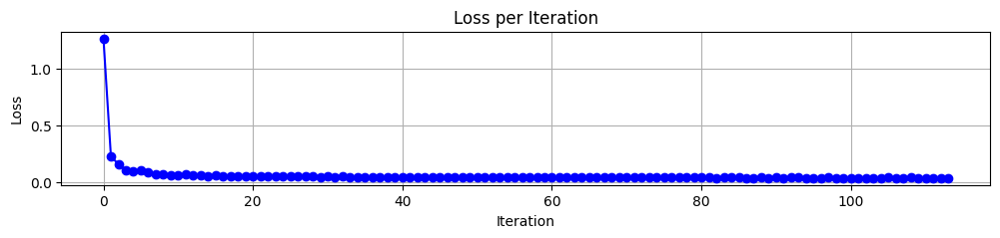

In [263]:
plt.figure(figsize=(12, 2))

# 반복 단위 손실 그래프
plt.plot(train_flatten, label='Train (per iter)', linestyle='-', marker='o', color='blue')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

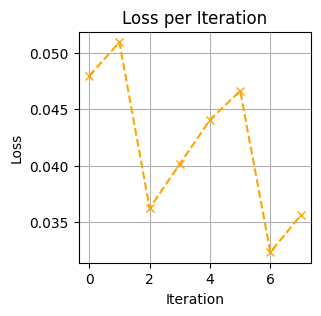

In [264]:
plt.plot(val_flatten, label='Validation (per iter)', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

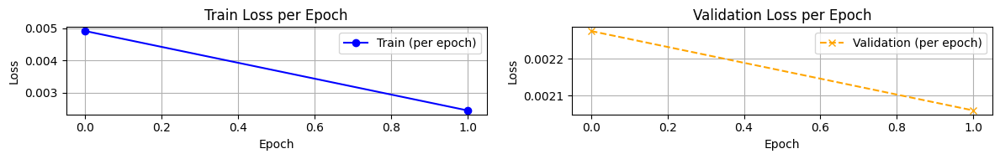

In [265]:
# 1행 2열 레이아웃 생성
fig, axes = plt.subplots(1, 2, figsize=(12, 2))  # 그래프 크기 조정

# Train loss per epoch 그래프
axes[0].plot(train_loss_per_epoch, label='Train (per epoch)', linestyle='-', marker='o', color='blue')
axes[0].set_title("Train Loss per Epoch")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid()
axes[0].legend()

# Validation loss per epoch 그래프
axes[1].plot(val_loss_per_epoch, label='Validation (per epoch)', linestyle='--', marker='x', color='orange')
axes[1].set_title("Validation Loss per Epoch")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Loss")
axes[1].grid()
axes[1].legend()

plt.tight_layout()
plt.show()

# 평가

In [266]:
!pwd

/root/code/unet/attention_channel


In [267]:
%cd /root/code/unet/attention_channel

/root/code/unet/attention_channel


In [268]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

## batch size 16

### loss 추이 관찰

In [269]:
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNetWithChannelAttention().to(device)
model.load_state_dict(torch.load('unet_C_A.pth'))

<All keys matched successfully>

In [270]:
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0)
len(test_loader)

6025

In [271]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf
from tqdm import tqdm  # tqdm을 올바르게 import

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating:  17%|█▋        | 1012/6025 [00:09<00:47, 106.42it/s]

train loss : 0.03817692046333104


Evaluating:  33%|███▎      | 2013/6025 [00:18<00:37, 106.70it/s]

train loss : 0.03574017883092165


Evaluating:  50%|█████     | 3014/6025 [00:28<00:28, 106.60it/s]

train loss : 0.03698457816662267


Evaluating:  67%|██████▋   | 4015/6025 [00:37<00:18, 106.71it/s]

train loss : 0.02698879482597113


Evaluating:  83%|████████▎ | 5016/6025 [00:46<00:09, 106.64it/s]

train loss : 0.026573002957738935


Evaluating: 100%|█████████▉| 6017/6025 [00:56<00:00, 106.72it/s]

train loss : 0.023809969298075884


Evaluating: 100%|██████████| 6025/6025 [00:56<00:00, 107.40it/s]


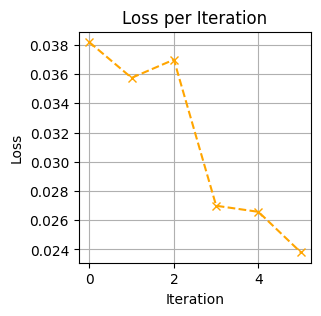

In [272]:
plt.plot(loss_list, label='Test', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

### 16개 개별비교

In [273]:
def visualize_patches_total(X, y, X_hat):

    fig, axes = plt.subplots(3, 16, figsize=(32, 6))  # 3행 16열로 설정
    fig.suptitle("Patches", fontsize=12, y=1.05)  # 전체 제목 추가

    for i in range(X.shape[0]):  # 16개의 이미지만큼 반복
        # X 데이터 시각화
        axes[0, i].imshow(X[i], cmap='gray', vmin=-200, vmax=300)
        axes[0, i].axis('off')
        axes[0, i].set_title(f"X {i+1}", fontsize=12)
        
        # y 데이터 시각화
        axes[1, i].imshow(y[i], cmap='gray', vmin=-200, vmax=300)
        axes[1, i].axis('off')
        axes[1, i].set_title(f"y {i+1}", fontsize=12)
        
        # X_hat 데이터 시각화
        axes[2, i].imshow(X_hat[i], cmap='gray', vmin=-200, vmax=300)
        axes[2, i].axis('off')
        axes[2, i].set_title(f"X_hat {i+1}", fontsize=12)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # 제목 위치 조정
    plt.show()


In [274]:
# 1. 랜덤비교

test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0)
test_iter = iter(test_loader)
len(test_iter)

6025

In [275]:
idx = 400 # 1~6025 여기 안에서 선택
for i in range(idx):
    X_test, y_test = next(test_iter)
    
X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(model(X_test.cuda()).cpu().detach()).numpy() * 500 - 500

In [276]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

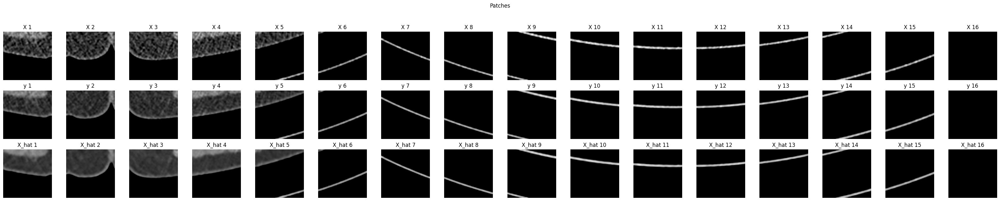

In [277]:
visualize_patches_total(X, y, X_hat)

In [278]:
# 2. 가장 loss가 낮은 값 확인

X_test,y_test,X_hat = best

X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(model(X_test.cuda()).cpu().detach()).numpy() * 500 - 500

In [279]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

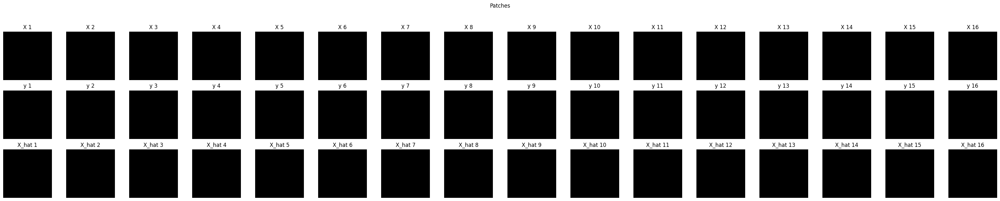

In [280]:
visualize_patches_total(X, y, X_hat)

In [281]:
# 3. 가장 loss가 높은 값 확인

X_test,y_test,X_hat = worst

X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(model(X_test.cuda()).cpu().detach()).numpy() * 500 - 500

In [282]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

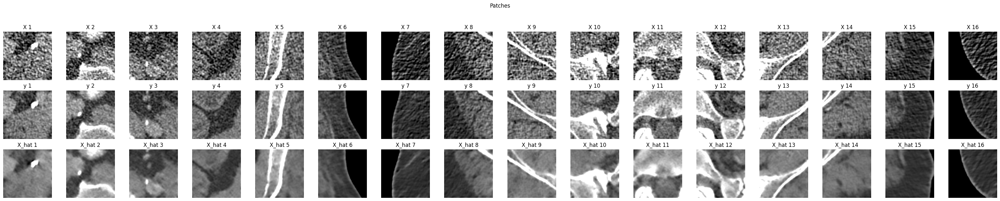

In [283]:
visualize_patches_total(X, y, X_hat)

## batch size = 81

In [284]:
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNetWithChannelAttention().to(device)
model.load_state_dict(torch.load('unet_C_A.pth'))

<All keys matched successfully>

In [285]:
test_loader = DataLoader(test_dataset, batch_size=81, shuffle=False, num_workers=0)
len(test_loader)

1190

In [286]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating:  84%|████████▍ | 1002/1190 [00:41<00:07, 23.66it/s]

train loss : 0.16624629857693798


Evaluating: 100%|██████████| 1190/1190 [00:49<00:00, 23.87it/s]


### 함수정의

In [287]:
def reconstruct_image(prediction, num_patches_per_row=9, patch_size=55):
    # prediction: (81, 1, 55, 55) 크기의 torch 텐서
    num_patches = prediction.shape[0]  # 81개의 패치
    assert prediction.shape == (81, 1, 55, 55) # "패치의 크기가 올바르지 않습니다."
    
    # 최종적으로 1x495x495 크기의 이미지를 만들기 위한 초기화
    final_image = torch.zeros(1, num_patches_per_row * patch_size, num_patches_per_row * patch_size)
    
    # 9x9 배열로 패치 붙이기
    for i in range(num_patches):
        row = i // num_patches_per_row  # 현재 패치의 행 번호
        col = i % num_patches_per_row   # 현재 패치의 열 번호
        
        # 패치를 해당 위치에 붙이기
        final_image[:, 
                    row * patch_size:(row + 1) * patch_size, 
                    col * patch_size:(col + 1) * patch_size] = prediction[i, 0]

    return final_image

In [288]:
def extract_patches(img, patch_size=55, interval=55):
    patches = []
    _, height, width = img.shape
    for y in range(0, height - patch_size + 1, interval):
        for x in range(0, width - patch_size + 1, interval):
            patch = img[:, y:y + patch_size, x:x + patch_size]
            patches.append(patch)
    patches = torch.stack(patches)  # 리스트를 텐서로 변환
    return patches  # 반환 형태는 patch 수 x 1 x 55 x 55

In [289]:
def rescale(img):
    return img*500-500 # -1000부터 2000의 값으로 다시 변환

In [290]:
def trans_img(X):
    return rescale(np.squeeze(reconstruct_image(X)))

In [291]:
X_test,y_test,X_hat = best
trans_img(X_test).min(), trans_img(X_test).max()

(tensor(-1024.), tensor(1915.))

In [292]:
trans_img(X_test).shape

torch.Size([495, 495])

In [293]:
!pwd

/root/code/unet/attention_channel


In [294]:
def save_img(X_test, X_hat, y_test, s):
    # X_test 저장
    numpy_X_test = trans_img(X_test).numpy()
    np.save(f'X_test_image{s}.npy', numpy_X_test)
    
    # X_hat 저장
    numpy_X_hat = trans_img(X_hat).numpy()
    np.save(f'X_hat_image{s}.npy', numpy_X_hat)
    
    # y_test 저장
    numpy_y_test = trans_img(y_test).numpy()
    np.save(f'y_test_image{s}.npy', numpy_y_test)

### 1. best

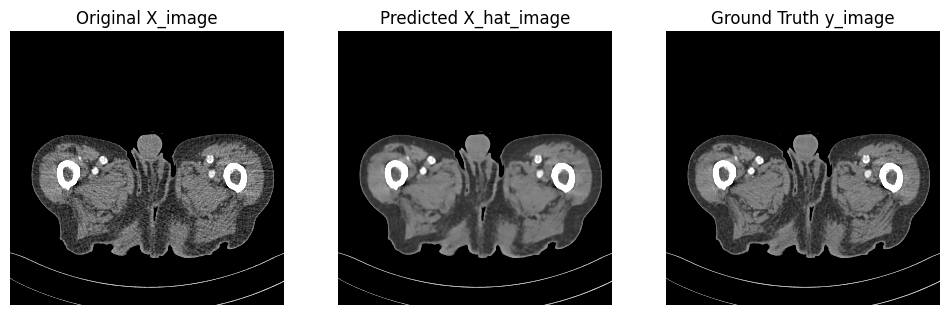

In [295]:
# 1. 가장 좋은 값 가져오기
X_test,y_test,X_hat = best

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(trans_img(X_hat), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(trans_img(y_test), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [296]:
# 이미지 저장

save_img(X_test, X_hat, y_test, 'best')

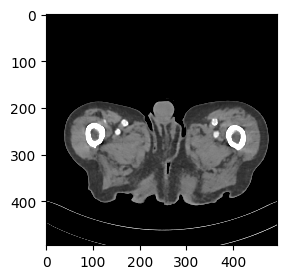

In [297]:
# 불러오기

import numpy as np

s = 'best'
X_test = np.load(f'X_hat_image{s}.npy')

plt.imshow(X_test, cmap='gray', vmin=-200, vmax=300)

### 2. worst

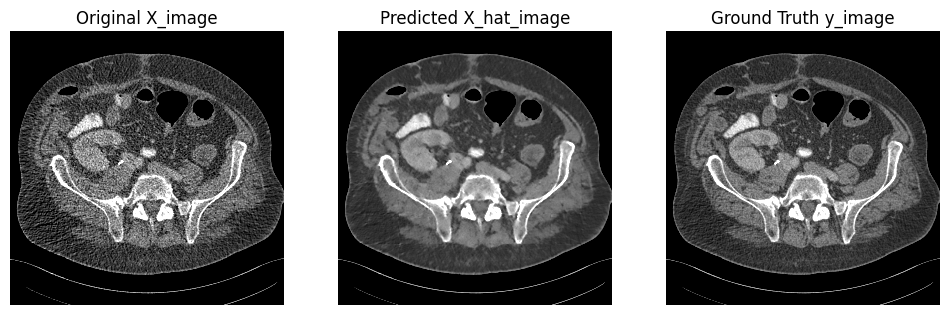

In [298]:
# 2. 가장 나쁜 값 가져오기
X_test,y_test,X_hat = worst

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(trans_img(X_hat), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(trans_img(y_test), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [299]:
# 이미지 저장

save_img(X_test, X_hat, y_test, 'worst')

### 3. 랜덤

In [300]:
import glob
# 3. 랜덤선택

i,j = 0,0
X_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[0]}/*.IMA'))[j]
y_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[1]}/*.IMA'))[j]

X_image, y_image = normlize(X_dir), normlize(y_dir)
X_patches = extract_patches(torch.from_numpy(X_image))

X_image.shape, y_image.shape, X_patches.shape

((1, 512, 512), (1, 512, 512), torch.Size([81, 1, 55, 55]))

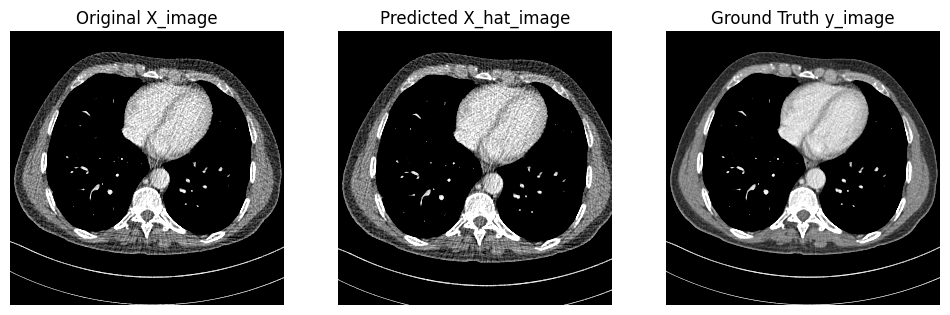

In [301]:
# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(rescale(np.squeeze(X_image)), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(rescale(np.squeeze(reconstruct_image(X_patches))), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(rescale(np.squeeze(y_image)), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [302]:
!pwd

/root/code/unet/attention_channel


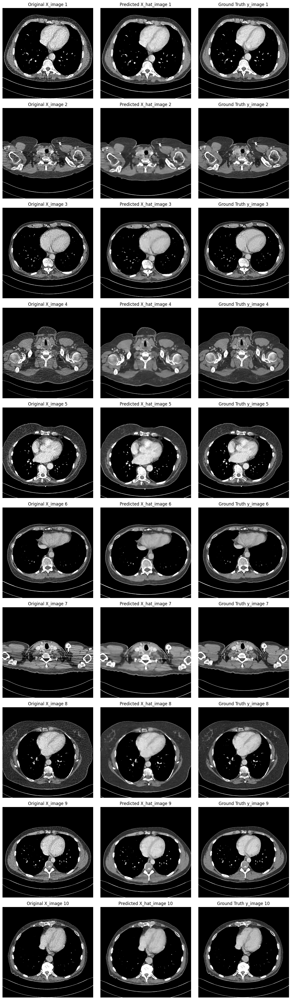

In [303]:
import matplotlib.pyplot as plt
import numpy as np

i, n = 0, 10
L = L_list[i]

# 전체 이미지 배열을 생성
fig, axes = plt.subplots(n, 3, figsize=(12, 4 * n))

for i in range(n):
    X_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[0]}/*.IMA'))[j]
    y_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[1]}/*.IMA'))[j]
    X_image, y_image = normlize(X_dir), normlize(y_dir)
    X_patches = extract_patches(torch.from_numpy(X_image))
    X_hat_patches = model(X_patches.cuda()).cpu().detach()
    reconstructed_image = reconstruct_image(X_hat_patches)

    # X_image 표시
    axes[i, 0].imshow(rescale(np.squeeze(X_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 0].set_title(f"Original X_image {i+1}")
    axes[i, 0].axis('off')

    # X_hat_image 표시
    axes[i, 1].imshow(rescale(np.squeeze(reconstructed_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 1].set_title(f"Predicted X_hat_image {i+1}")
    axes[i, 1].axis('off')

    # y_image 표시
    axes[i, 2].imshow(rescale(np.squeeze(y_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 2].set_title(f"Ground Truth y_image {i+1}")
    axes[i, 2].axis('off')

# 모든 이미지 저장
plt.tight_layout()
plt.savefig("comparison_images.png", format="png")  # 한번에 저장
plt.show()  # 모든 이미지 표시

# attention 확인

In [393]:
!pwd

/root/code/unet/attention_spatial


In [394]:
%cd /root/code/unet/attention_channel/

/root/code/unet/attention_channel


In [395]:
# 모델 정의
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNetWithChannelAttention().to(device)

# 저장된 가중치 로드
model.load_state_dict(torch.load('unet_C_A.pth'))
model.eval()

UNetWithChannelAttention(
  (encoder): ModuleList(
    (0): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

## best / worst 이미지의 attention 확인

### 1. best

In [396]:
X_test,y_test,X_hat = best
X_test.shape

torch.Size([81, 1, 55, 55])

In [397]:
X_test.to(device)
output = model(X_test)

In [398]:
# Forward Pass
output = model(X_test)

model.attention_blocks[1].last_attention.shape

torch.Size([81, 128, 1, 1])

In [399]:
import numpy as np

# Attention Weight 가져오기 (예: 첫 번째 SEBlock)
attention_weights2 = model.attention_blocks[1].last_attention.squeeze().cpu().detach().numpy()  # [81, 96]
attention_weights4 = model.attention_blocks[3].last_attention.squeeze().cpu().detach().numpy()

# 배치 차원에서 평균 계산
mean_attention_weights2 = np.mean(attention_weights2, axis=0)  # [96]
mean_attention_weights4 = np.mean(attention_weights4, axis=0)  # [96]

mean_attention_weights2.shape, mean_attention_weights4.shape

((128,), (512,))

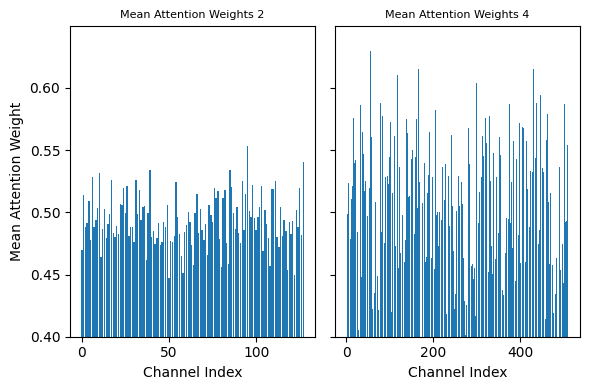

In [412]:
# 배치 차원에서 평균 계산
mean_attention_weights2 = np.mean(attention_weights2, axis=0)  # [96]
mean_attention_weights4 = np.mean(attention_weights4, axis=0)  # [96]

# y축 최소값과 공통 최대값 설정
y_min = 0.4  # y축 최소값 변경 가능
y_max = max(mean_attention_weights2.max(), mean_attention_weights4.max())  # 공통 최대값

# Subplot 설정
fig, axes = plt.subplots(1, 2, figsize=(6, 4), sharey=True)

# 첫 번째 subplot
axes[0].bar(range(len(mean_attention_weights2)), mean_attention_weights2)
axes[0].set_title("Mean Attention Weights 2", fontsize=8)
axes[0].set_xlabel("Channel Index")
axes[0].set_ylabel("Mean Attention Weight")
axes[0].set_ylim(y_min, y_max)  # 공통 y축 범위 설정

# 두 번째 subplot
axes[1].bar(range(len(mean_attention_weights4)), mean_attention_weights4)
axes[1].set_title("Mean Attention Weights 4", fontsize=8)
axes[1].set_xlabel("Channel Index")
axes[1].set_ylim(y_min, y_max)  # 공통 y축 범위 설정

# 레이아웃 조정 및 표시
plt.tight_layout()
plt.show()

In [404]:
# # 배치 차원에서 평균 계산
# mean_attention_weights2 = np.mean(attention_weights2, axis=0)  # [96]
# mean_attention_weights4 = np.mean(attention_weights4, axis=0)  # [96]

# # Threshold 설정
# threshold = 0.1

# # Threshold를 넘는 채널만 필터링
# indices2 = np.where(mean_attention_weights2 > threshold)[0]
# weights2 = mean_attention_weights2[indices2]

# indices4 = np.where(mean_attention_weights4 > threshold)[0]
# weights4 = mean_attention_weights4[indices4]

# # Subplot 설정
# fig, axes = plt.subplots(1, 2, figsize=(6, 4), sharey=True)

# # 첫 번째 subplot
# axes[0].bar(indices2, weights2)
# axes[0].set_title(f"Mean Attention Weights 2 (Threshold > {threshold})", fontsize=8)
# axes[0].set_xlabel("Channel Index")
# axes[0].set_ylabel("Mean Attention Weight")

# # 두 번째 subplot
# axes[1].bar(indices4, weights4)
# axes[1].set_title(f"Mean Attention Weights 3 (Threshold > {threshold})", fontsize=8)
# axes[1].set_xlabel("Channel Index")

# # 레이아웃 조정 및 표시
# plt.tight_layout()
# plt.show()

In [401]:
from decimal import Decimal

# attention2의 mean과 sd 계산
mean2 = Decimal(str(np.mean(mean_attention_weights2))).quantize(Decimal('0.001'))
sd2 = Decimal(str(np.sqrt(np.var(mean_attention_weights2)))).quantize(Decimal('0.001'))

# attention3의 mean과 sd 계산
mean4 = Decimal(str(np.mean(mean_attention_weights4))).quantize(Decimal('0.001'))
sd4 = Decimal(str(np.sqrt(np.var(mean_attention_weights4)))).quantize(Decimal('0.001'))

# 출력
print(f"Attention 2 - mean: {mean2}, sd: {sd2}")
print(f"Attention 4 - mean: {mean4}, sd: {sd4}")
# 평균은 비슷하다. 즉, channel을 늘려야 일부만 들어가는데,,
# 그래야 그나마 정보가 많이 들어간다.

Attention 2 - mean: 0.495, sd: 0.018
Attention 4 - mean: 0.503, sd: 0.057


### 2. worst

In [413]:
X_test,y_test,X_hat = worst
X_test.shape

torch.Size([81, 1, 55, 55])

In [414]:
X_test.to(device)
output = model(X_test)

In [415]:
# Forward Pass
output = model(X_test)

model.attention_blocks[1].last_attention.shape

torch.Size([81, 128, 1, 1])

In [416]:
import numpy as np

# Attention Weight 가져오기 (예: 첫 번째 SEBlock)
attention_weights2 = model.attention_blocks[1].last_attention.squeeze().cpu().detach().numpy()  # [81, 96]
attention_weights4 = model.attention_blocks[3].last_attention.squeeze().cpu().detach().numpy()

# 배치 차원에서 평균 계산
mean_attention_weights2 = np.mean(attention_weights2, axis=0)  # [96]
mean_attention_weights4 = np.mean(attention_weights4, axis=0)  # [96]

mean_attention_weights2.shape, mean_attention_weights4.shape

((128,), (512,))

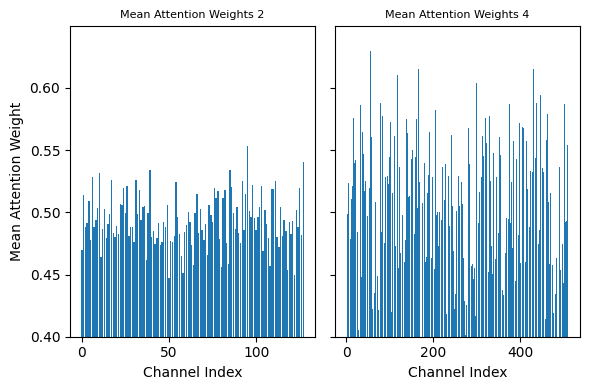

In [417]:
# 배치 차원에서 평균 계산
mean_attention_weights2 = np.mean(attention_weights2, axis=0)  # [96]
mean_attention_weights4 = np.mean(attention_weights4, axis=0)  # [96]

# y축 최소값과 공통 최대값 설정
y_min = 0.4  # y축 최소값 변경 가능
y_max = max(mean_attention_weights2.max(), mean_attention_weights4.max())  # 공통 최대값

# Subplot 설정
fig, axes = plt.subplots(1, 2, figsize=(6, 4), sharey=True)

# 첫 번째 subplot
axes[0].bar(range(len(mean_attention_weights2)), mean_attention_weights2)
axes[0].set_title("Mean Attention Weights 2", fontsize=8)
axes[0].set_xlabel("Channel Index")
axes[0].set_ylabel("Mean Attention Weight")
axes[0].set_ylim(y_min, y_max)  # 공통 y축 범위 설정

# 두 번째 subplot
axes[1].bar(range(len(mean_attention_weights4)), mean_attention_weights4)
axes[1].set_title("Mean Attention Weights 4", fontsize=8)
axes[1].set_xlabel("Channel Index")
axes[1].set_ylim(y_min, y_max)  # 공통 y축 범위 설정

# 레이아웃 조정 및 표시
plt.tight_layout()
plt.show()

In [418]:
# # 배치 차원에서 평균 계산
# mean_attention_weights2 = np.mean(attention_weights2, axis=0)  # [96]
# mean_attention_weights4 = np.mean(attention_weights4, axis=0)  # [96]

# # Threshold 설정
# threshold = 0.1

# # Threshold를 넘는 채널만 필터링
# indices2 = np.where(mean_attention_weights2 > threshold)[0]
# weights2 = mean_attention_weights2[indices2]

# indices4 = np.where(mean_attention_weights4 > threshold)[0]
# weights4 = mean_attention_weights4[indices4]

# # Subplot 설정
# fig, axes = plt.subplots(1, 2, figsize=(6, 4), sharey=True)

# # 첫 번째 subplot
# axes[0].bar(indices2, weights2)
# axes[0].set_title(f"Mean Attention Weights 2 (Threshold > {threshold})", fontsize=8)
# axes[0].set_xlabel("Channel Index")
# axes[0].set_ylabel("Mean Attention Weight")

# # 두 번째 subplot
# axes[1].bar(indices4, weights4)
# axes[1].set_title(f"Mean Attention Weights 3 (Threshold > {threshold})", fontsize=8)
# axes[1].set_xlabel("Channel Index")

# # 레이아웃 조정 및 표시
# plt.tight_layout()
# plt.show()

In [419]:
from decimal import Decimal

# attention2의 mean과 sd 계산
mean2 = Decimal(str(np.mean(mean_attention_weights2))).quantize(Decimal('0.001'))
sd2 = Decimal(str(np.sqrt(np.var(mean_attention_weights2)))).quantize(Decimal('0.001'))

# attention3의 mean과 sd 계산
mean4 = Decimal(str(np.mean(mean_attention_weights4))).quantize(Decimal('0.001'))
sd4 = Decimal(str(np.sqrt(np.var(mean_attention_weights4)))).quantize(Decimal('0.001'))

# 출력
print(f"Attention 2 - mean: {mean2}, sd: {sd2}")
print(f"Attention 4 - mean: {mean4}, sd: {sd4}")
# 평균은 비슷하다. 즉, channel을 늘려야 일부만 들어가는데,,
# 그래야 그나마 정보가 많이 들어간다.

Attention 2 - mean: 0.494, sd: 0.020
Attention 4 - mean: 0.503, sd: 0.054


## 결론??
잘나올수록 attention이 마지막 layer에서 더 차등이 크다. 그러니까 마지막 layer에서 attention이 더 효과가 있을수록 좋은 성능을 보인 것이다.

# attention모델2; Spatial Attention

Channel attetion과 마찬가지로 attention을 encoder의 2,4번쨰 conv block 뒤에 설치

In [317]:
import torch
import torch.nn as nn

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        assert kernel_size in (3, 7), "Kernel size must be 3 or 7"
        padding = (kernel_size - 1) // 2 # 동일한 크기를 유지하기 위한 패딩
        self.conv = nn.Conv2d(2, 1, kernel_size=kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()
        self.last_attention = None  # Attention 값을 저장하는 변수

    def forward(self, x):
        # 채널 차원을 압축 (Max Pooling과 Average Pooling)
        avg_out = torch.mean(x, dim=1, keepdim=True) # Average pooling
        max_out, _ = torch.max(x, dim=1, keepdim=True) # Max pooling
        combined = torch.cat([avg_out, max_out], dim=1) # 채널 차원에서 결합
        # 2D Convolution 적용
        attention = self.sigmoid(self.conv(combined)) # [B, 1, H, W]
        self.last_attention = attention  # Attention 값을 저장
        return x * attention

In [318]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [319]:
import torch
import torch.nn as nn
import torch.nn.functional as F


# UNet with Selective Channel Attention
class UNetWithSpatialAttention(nn.Module):
    def __init__(self, in_channels=1, out_channels=1, features=[64, 128, 256, 512], reduction=16):
        super(UNetWithSpatialAttention, self).__init__()

        self.encoder = nn.ModuleList()
        self.decoder = nn.ModuleList()
        self.attention_blocks = nn.ModuleList()

        # Encoder Path
        for idx, feature in enumerate(features):
            self.encoder.append(self.conv_block(in_channels, feature))
            if idx in [1, 3]:  # Attention 적용 위치
                self.attention_blocks.append(SpatialAttention())
            else:
                self.attention_blocks.append(nn.Identity())  # Placeholder로 nn.Identity 사용
            in_channels = feature

        # Bottleneck
        self.bottleneck = self.conv_block(features[-1], features[-1] * 2)

        # Decoder Path
        for feature in reversed(features):
            self.decoder.append(nn.ConvTranspose2d(feature * 2, feature, kernel_size=2, stride=2))
            self.decoder.append(self.conv_block(feature * 2, feature))

        # Final Convolution
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x):
        enc_outputs = []

        # Encoder Path
        for idx, layer in enumerate(self.encoder):
            x = layer(x)
            x = self.attention_blocks[idx](x)  # Attention 적용
            enc_outputs.append(x)
            x = F.max_pool2d(x, kernel_size=2, stride=2)

        # Bottleneck
        x = self.bottleneck(x)

        # Decoder Path
        for idx in range(0, len(self.decoder), 2):
            x = self.decoder[idx](x)  # Upsample
            enc_output = enc_outputs[-(idx // 2) - 1]  # Skip connection
            x = F.interpolate(x, size=enc_output.shape[2:], mode='bilinear', align_corners=False)
            x = torch.cat((enc_output, x), dim=1)  # Concatenate
            x = self.decoder[idx + 1](x)  # Convolution after concatenation

        return self.final_conv(x)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )


In [320]:
model = UNetWithSpatialAttention().to(device)
model


UNetWithSpatialAttention(
  (encoder): ModuleList(
    (0): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

In [321]:
%cd /root/code

import utils.EarlyStopping
import utils.LRScheduler
import utils.train_eval_util
import importlib
importlib.reload(utils.EarlyStopping)
importlib.reload(utils.LRScheduler)
importlib.reload(utils.train_eval_util)

/root/code


<module 'utils.train_eval_util' from '/root/code/utils/train_eval_util.py'>

In [322]:
import torch.nn as nn
criterion = nn.MSELoss()

from utils.EarlyStopping import *
from utils.LRScheduler import *
from utils.train_eval_util import train, evaluate

learning_rate = 1e-5
optimizer = torch.optim.Adam(params = model.parameters(),
                             lr = learning_rate)


early_stopping = EarlyStopping(patience = 7, # 7번까지는 개선이 안되어도 봐준다.
                               min_delta = 1e-5) # 이정도는 개선이 되어야한다. 아니면 위의 patience까지 count하다가 stop


scheduler = LRScheduler(optimizer = optimizer,
                        patience = 5,
                        min_lr = 1e-10,
                        factor = 0.5)

In [323]:
import torch
from tqdm import tqdm

interval = 1000

def train(model, train_loader, optimizer, criterion, device, epoch):
    model.train()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    for i, data in tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch} - Training"):
        X, y = data[0].to(device), data[1].to(device)
        optimizer.zero_grad()
        X_hat = model(X)
        loss = criterion(X_hat, y)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(train_loader.dataset)

def evaluate(model, loader, criterion, device, epoch):
    model.eval()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    with torch.no_grad():
        for i, data in tqdm(enumerate(loader), total=len(loader), desc=f"Epoch {epoch} - Evaluating"):
            X, y = data[0].to(device), data[1].to(device)
            X_hat = model(X)
            loss = criterion(X_hat, y)

            running_loss += loss.item() * X.size(0)

            if i % interval == interval-1:
                interval_loss = running_loss / interval
                loss_list.append(interval_loss)
                total_loss += running_loss
                running_loss = 0.0
                tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(loader.dataset)

# 학습

In [324]:
!pwd

/root/code


In [325]:
%cd /root/code/unet/attention_spatial

/root/code/unet/attention_spatial


In [326]:
epochs = 2 # 각 epoch마다 train(20분), valid(2분)이 소요된다.
best_valid_loss = float('inf')
train_loss_per_iter = []
train_loss_per_epoch = []
val_loss_per_iter = []
val_loss_per_epoch = []

for epoch in range(epochs):
    loss_list, total_loss = train(model, train_loader, optimizer, criterion, device, epoch)
    train_loss_per_iter.append(loss_list)
    train_loss_per_epoch.append(total_loss)

    loss_list, total_loss = evaluate(model, val_loader, criterion, device, epoch)
    val_loss_per_iter.append(loss_list)
    val_loss_per_epoch.append(total_loss)

    print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss_per_epoch[-1]:.4f}, Valid Loss: {val_loss_per_epoch[-1]:.4f}")

    valid_loss = val_loss_per_epoch[-1]
    scheduler(valid_loss)

    if (early_stopping(valid_loss)):
        break

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        epochs_no_improve = 0
        torch.save(model.state_dict(), "./" + 'unet_S_A' + ".pth")

Epoch 0 - Training:   2%|▏         | 1005/57596 [00:29<28:20, 33.29it/s]

train loss : 1.4842199629321695


Epoch 0 - Training:   3%|▎         | 2005/57596 [00:58<25:22, 36.50it/s]

train loss : 0.24372754825651646


Epoch 0 - Training:   5%|▌         | 3005/57596 [01:28<27:23, 33.22it/s]

train loss : 0.1726424240320921


Epoch 0 - Training:   7%|▋         | 4005/57596 [01:57<26:38, 33.53it/s]

train loss : 0.16011301283165813


Epoch 0 - Training:   9%|▊         | 5005/57596 [02:27<25:35, 34.26it/s]

train loss : 0.10579044463485479


Epoch 0 - Training:  10%|█         | 6005/57596 [02:54<24:55, 34.51it/s]

train loss : 0.09661145523563028


Epoch 0 - Training:  12%|█▏        | 7005/57596 [03:23<24:59, 33.74it/s]

train loss : 0.09538442927226425


Epoch 0 - Training:  14%|█▍        | 8005/57596 [03:53<23:00, 35.91it/s]

train loss : 0.08010436622798443


Epoch 0 - Training:  16%|█▌        | 9005/57596 [04:22<24:00, 33.74it/s]

train loss : 0.08099382218345999


Epoch 0 - Training:  17%|█▋        | 10005/57596 [04:52<26:18, 30.15it/s]

train loss : 0.0710516574010253


Epoch 0 - Training:  19%|█▉        | 11005/57596 [05:22<23:00, 33.74it/s]

train loss : 0.07087252195551992


Epoch 0 - Training:  21%|██        | 12006/57596 [05:52<22:50, 33.26it/s]

train loss : 0.072228889612481


Epoch 0 - Training:  23%|██▎       | 13004/57596 [06:23<22:47, 32.60it/s]

train loss : 0.06963628756254911


Epoch 0 - Training:  24%|██▍       | 14006/57596 [06:53<21:39, 33.53it/s]

train loss : 0.06545163046568632


Epoch 0 - Training:  26%|██▌       | 15006/57596 [07:23<21:20, 33.26it/s]

train loss : 0.06443158232234418


Epoch 0 - Training:  28%|██▊       | 16006/57596 [07:52<20:49, 33.30it/s]

train loss : 0.058545001469552514


Epoch 0 - Training:  30%|██▉       | 17006/57596 [08:22<20:20, 33.27it/s]

train loss : 0.058282095337286594


Epoch 0 - Training:  31%|███▏      | 18006/57596 [08:52<21:16, 31.01it/s]

train loss : 0.053461064726114275


Epoch 0 - Training:  33%|███▎      | 19006/57596 [09:23<19:04, 33.73it/s]

train loss : 0.056124942786991594


Epoch 0 - Training:  35%|███▍      | 20006/57596 [09:54<18:34, 33.73it/s]

train loss : 0.059767025517299774


Epoch 0 - Training:  36%|███▋      | 21006/57596 [10:23<18:20, 33.25it/s]

train loss : 0.05591901407763362


Epoch 0 - Training:  38%|███▊      | 22006/57596 [10:53<17:58, 33.01it/s]

train loss : 0.059256476618349554


Epoch 0 - Training:  40%|███▉      | 23006/57596 [11:22<17:06, 33.69it/s]

train loss : 0.05344649735093117


Epoch 0 - Training:  42%|████▏     | 24006/57596 [11:52<16:48, 33.31it/s]

train loss : 0.05858806831017137


Epoch 0 - Training:  43%|████▎     | 25005/57596 [12:22<16:15, 33.40it/s]

train loss : 0.055707772413268686


Epoch 0 - Training:  45%|████▌     | 26005/57596 [12:51<15:33, 33.85it/s]

train loss : 0.05432960106991232


Epoch 0 - Training:  47%|████▋     | 27006/57596 [13:21<15:03, 33.85it/s]

train loss : 0.056335324589163065


Epoch 0 - Training:  49%|████▊     | 28003/57596 [13:52<14:15, 34.57it/s]

train loss : 0.05533333375118673


Epoch 0 - Training:  50%|█████     | 29003/57596 [14:21<14:03, 33.89it/s]

train loss : 0.04906647162698209


Epoch 0 - Training:  52%|█████▏    | 30003/57596 [14:51<13:48, 33.30it/s]

train loss : 0.05148645696789026


Epoch 0 - Training:  54%|█████▍    | 31004/57596 [15:23<14:54, 29.73it/s]

train loss : 0.049378977874293926


Epoch 0 - Training:  56%|█████▌    | 32005/57596 [15:54<12:39, 33.70it/s]

train loss : 0.05109393809735775


Epoch 0 - Training:  57%|█████▋    | 33004/57596 [16:24<13:43, 29.86it/s]

train loss : 0.04938661771267652


Epoch 0 - Training:  59%|█████▉    | 34003/57596 [16:54<12:17, 32.00it/s]

train loss : 0.05046032358892262


Epoch 0 - Training:  61%|██████    | 35006/57596 [17:25<11:17, 33.34it/s]

train loss : 0.04771190536208451


Epoch 0 - Training:  63%|██████▎   | 36003/57596 [17:56<10:50, 33.21it/s]

train loss : 0.046393400518223646


Epoch 0 - Training:  64%|██████▍   | 37005/57596 [18:26<10:14, 33.53it/s]

train loss : 0.048831654148176314


Epoch 0 - Training:  66%|██████▌   | 38005/57596 [18:55<09:47, 33.36it/s]

train loss : 0.047811506751924755


Epoch 0 - Training:  68%|██████▊   | 39005/57596 [19:25<09:17, 33.35it/s]

train loss : 0.0471350829526782


Epoch 0 - Training:  69%|██████▉   | 40005/57596 [19:55<08:46, 33.44it/s]

train loss : 0.05060836939513683


Epoch 0 - Training:  71%|███████   | 41005/57596 [20:24<08:15, 33.45it/s]

train loss : 0.04667582830786705


Epoch 0 - Training:  73%|███████▎  | 42005/57596 [20:54<07:39, 33.89it/s]

train loss : 0.04611980488710105


Epoch 0 - Training:  75%|███████▍  | 43005/57596 [21:24<07:28, 32.52it/s]

train loss : 0.04549918134137988


Epoch 0 - Training:  76%|███████▋  | 44005/57596 [21:54<06:41, 33.82it/s]

train loss : 0.05020143137685955


Epoch 0 - Training:  78%|███████▊  | 45005/57596 [22:23<06:15, 33.49it/s]

train loss : 0.04696050077490509


Epoch 0 - Training:  80%|███████▉  | 46005/57596 [22:53<05:44, 33.68it/s]

train loss : 0.04425049353018403


Epoch 0 - Training:  82%|████████▏ | 47005/57596 [23:22<05:15, 33.57it/s]

train loss : 0.04796852245181799


Epoch 0 - Training:  83%|████████▎ | 48004/57596 [23:52<05:00, 31.94it/s]

train loss : 0.045545709807425734


Epoch 0 - Training:  85%|████████▌ | 49004/57596 [24:22<04:15, 33.64it/s]

train loss : 0.04617616047337651


Epoch 0 - Training:  87%|████████▋ | 50004/57596 [24:51<03:47, 33.44it/s]

train loss : 0.047708212543278936


Epoch 0 - Training:  89%|████████▊ | 51004/57596 [25:21<03:29, 31.52it/s]

train loss : 0.04429825092665851


Epoch 0 - Training:  90%|█████████ | 52004/57596 [25:52<02:47, 33.36it/s]

train loss : 0.04350189253129065


Epoch 0 - Training:  92%|█████████▏| 53004/57596 [26:22<02:18, 33.16it/s]

train loss : 0.04537329741939902


Epoch 0 - Training:  94%|█████████▍| 54003/57596 [26:53<01:56, 30.80it/s]

train loss : 0.04449570079706609


Epoch 0 - Training:  95%|█████████▌| 55004/57596 [27:24<01:17, 33.27it/s]

train loss : 0.04649731004796922


Epoch 0 - Training:  97%|█████████▋| 56004/57596 [27:54<00:47, 33.34it/s]

train loss : 0.04491769646294415


Epoch 0 - Training:  99%|█████████▉| 57004/57596 [28:24<00:17, 33.38it/s]

train loss : 0.042954941494390365


Epoch 0 - Evaluating:  21%|██        | 1012/4815 [00:09<00:35, 106.91it/s]

train loss : 0.045460822694934906


Epoch 0 - Evaluating:  42%|████▏     | 2013/4815 [00:18<00:26, 106.76it/s]

train loss : 0.049131603269837794


Epoch 0 - Evaluating:  63%|██████▎   | 3014/4815 [00:28<00:16, 106.74it/s]

train loss : 0.03343913135770708


Epoch 0 - Evaluating:  83%|████████▎ | 4015/4815 [00:37<00:07, 106.85it/s]

train loss : 0.03719569916976616


Epoch 0 - Evaluating: 100%|██████████| 4815/4815 [00:44<00:00, 107.44it/s]


Epoch [1/2], Train Loss: 0.0055, Valid Loss: 0.0021


Epoch 1 - Training:   2%|▏         | 1006/57596 [00:29<27:24, 34.41it/s]

train loss : 0.04357408124953508


Epoch 1 - Training:   3%|▎         | 2006/57596 [00:59<27:26, 33.75it/s]

train loss : 0.044251074694097045


Epoch 1 - Training:   5%|▌         | 3006/57596 [01:28<27:11, 33.46it/s]

train loss : 0.0450256353598088


Epoch 1 - Training:   7%|▋         | 4006/57596 [01:58<26:32, 33.64it/s]

train loss : 0.04303393462486565


Epoch 1 - Training:   9%|▊         | 5006/57596 [02:27<26:17, 33.34it/s]

train loss : 0.04521004479937255


Epoch 1 - Training:  10%|█         | 6006/57596 [02:57<25:42, 33.44it/s]

train loss : 0.04337691439501941


Epoch 1 - Training:  12%|█▏        | 7006/57596 [03:27<24:26, 34.50it/s]

train loss : 0.04299336511828005


Epoch 1 - Training:  14%|█▍        | 8006/57596 [03:56<24:41, 33.47it/s]

train loss : 0.04468393945135176


Epoch 1 - Training:  16%|█▌        | 9004/57596 [04:26<24:11, 33.48it/s]

train loss : 0.04264299565181136


Epoch 1 - Training:  17%|█▋        | 10004/57596 [04:56<23:43, 33.43it/s]

train loss : 0.04219371414743364


Epoch 1 - Training:  19%|█▉        | 11004/57596 [05:26<22:56, 33.85it/s]

train loss : 0.042393948582932356


Epoch 1 - Training:  21%|██        | 12004/57596 [05:57<25:12, 30.14it/s]

train loss : 0.043126641016453506


Epoch 1 - Training:  23%|██▎       | 13004/57596 [06:28<24:17, 30.59it/s]

train loss : 0.04203839528001845


Epoch 1 - Training:  24%|██▍       | 14004/57596 [06:59<24:12, 30.01it/s]

train loss : 0.041659976344555615


Epoch 1 - Training:  26%|██▌       | 15004/57596 [07:29<21:30, 33.01it/s]

train loss : 0.04084443255327642


Epoch 1 - Training:  28%|██▊       | 16004/57596 [08:00<20:51, 33.22it/s]

train loss : 0.041016811929643154


Epoch 1 - Training:  30%|██▉       | 17004/57596 [08:32<20:12, 33.48it/s]

train loss : 0.042663238264620304


Epoch 1 - Training:  31%|███▏      | 18004/57596 [09:01<19:41, 33.50it/s]

train loss : 0.04222616390325129


Epoch 1 - Training:  33%|███▎      | 19004/57596 [09:31<19:13, 33.46it/s]

train loss : 0.04113367685303092


Epoch 1 - Training:  35%|███▍      | 20004/57596 [10:00<20:33, 30.47it/s]

train loss : 0.04225496137142181


Epoch 1 - Training:  36%|███▋      | 21004/57596 [10:30<18:04, 33.73it/s]

train loss : 0.04327247509360314


Epoch 1 - Training:  38%|███▊      | 22004/57596 [11:00<17:42, 33.50it/s]

train loss : 0.041515138728544114


Epoch 1 - Training:  40%|███▉      | 23004/57596 [11:30<17:00, 33.89it/s]

train loss : 0.04120043915882707


Epoch 1 - Training:  42%|████▏     | 24004/57596 [11:59<16:43, 33.47it/s]

train loss : 0.04033179785683751


Epoch 1 - Training:  43%|████▎     | 25004/57596 [12:29<16:12, 33.50it/s]

train loss : 0.04217188007943332


Epoch 1 - Training:  45%|████▌     | 26004/57596 [12:59<15:45, 33.43it/s]

train loss : 0.04167888074740767


Epoch 1 - Training:  47%|████▋     | 27004/57596 [13:28<15:14, 33.47it/s]

train loss : 0.041177851654589176


Epoch 1 - Training:  49%|████▊     | 28004/57596 [13:59<14:38, 33.70it/s]

train loss : 0.04221575450710952


Epoch 1 - Training:  50%|█████     | 29004/57596 [14:29<15:29, 30.75it/s]

train loss : 0.042592238204553726


Epoch 1 - Training:  52%|█████▏    | 30004/57596 [14:58<13:42, 33.56it/s]

train loss : 0.03959691601991654


Epoch 1 - Training:  54%|█████▍    | 31004/57596 [15:28<13:07, 33.76it/s]

train loss : 0.03994349606335163


Epoch 1 - Training:  56%|█████▌    | 32004/57596 [15:57<12:40, 33.63it/s]

train loss : 0.03971758932992816


Epoch 1 - Training:  57%|█████▋    | 33004/57596 [16:27<12:11, 33.62it/s]

train loss : 0.039958989705890416


Epoch 1 - Training:  59%|█████▉    | 34004/57596 [16:55<10:33, 37.24it/s]

train loss : 0.03996187404543161


Epoch 1 - Training:  61%|██████    | 35004/57596 [17:24<11:08, 33.78it/s]

train loss : 0.04170164204202592


Epoch 1 - Training:  63%|██████▎   | 36004/57596 [17:54<10:43, 33.56it/s]

train loss : 0.04012948593683541


Epoch 1 - Training:  64%|██████▍   | 37004/57596 [18:23<10:10, 33.75it/s]

train loss : 0.039890674803406


Epoch 1 - Training:  66%|██████▌   | 38004/57596 [18:53<10:03, 32.49it/s]

train loss : 0.03996694440767169


Epoch 1 - Training:  68%|██████▊   | 39004/57596 [19:23<09:11, 33.68it/s]

train loss : 0.040014712335541845


Epoch 1 - Training:  69%|██████▉   | 40004/57596 [19:52<08:41, 33.74it/s]

train loss : 0.03936504779942334


Epoch 1 - Training:  71%|███████   | 41004/57596 [20:22<09:04, 30.45it/s]

train loss : 0.04271912789531052


Epoch 1 - Training:  73%|███████▎  | 42004/57596 [20:52<07:42, 33.72it/s]

train loss : 0.042006736313924195


Epoch 1 - Training:  75%|███████▍  | 43004/57596 [21:21<07:12, 33.73it/s]

train loss : 0.039066870968788865


Epoch 1 - Training:  76%|███████▋  | 44004/57596 [21:51<06:43, 33.65it/s]

train loss : 0.041048352485522625


Epoch 1 - Training:  78%|███████▊  | 45004/57596 [22:21<06:14, 33.63it/s]

train loss : 0.040301197806373236


Epoch 1 - Training:  80%|███████▉  | 46004/57596 [22:50<05:45, 33.52it/s]

train loss : 0.0413982384223491


Epoch 1 - Training:  82%|████████▏ | 47004/57596 [23:21<05:34, 31.71it/s]

train loss : 0.03938456278853118


Epoch 1 - Training:  83%|████████▎ | 48004/57596 [23:50<04:42, 33.95it/s]

train loss : 0.03877605020813644


Epoch 1 - Training:  85%|████████▌ | 49004/57596 [24:20<04:13, 33.93it/s]

train loss : 0.03905888140387833


Epoch 1 - Training:  87%|████████▋ | 50004/57596 [24:49<03:45, 33.69it/s]

train loss : 0.041097971979528664


Epoch 1 - Training:  89%|████████▊ | 51004/57596 [25:19<03:15, 33.73it/s]

train loss : 0.03994329735450446


Epoch 1 - Training:  90%|█████████ | 52004/57596 [25:48<02:46, 33.63it/s]

train loss : 0.039914640089496974


Epoch 1 - Training:  92%|█████████▏| 53004/57596 [26:18<02:16, 33.68it/s]

train loss : 0.03950902196392417


Epoch 1 - Training:  94%|█████████▍| 54004/57596 [26:48<01:48, 33.01it/s]

train loss : 0.038171095412224534


Epoch 1 - Training:  95%|█████████▌| 55004/57596 [27:18<01:17, 33.62it/s]

train loss : 0.03966166056320071


Epoch 1 - Training:  97%|█████████▋| 56004/57596 [27:48<00:48, 32.89it/s]

train loss : 0.039025630079209804


Epoch 1 - Training:  99%|█████████▉| 57004/57596 [28:19<00:19, 31.15it/s]

train loss : 0.042001418253406884


Epoch 1 - Evaluating:  21%|██        | 1012/4815 [00:09<00:35, 107.45it/s]

train loss : 0.05592636772524565


Epoch 1 - Evaluating:  42%|████▏     | 2013/4815 [00:18<00:26, 107.20it/s]

train loss : 0.058955550396814944


Epoch 1 - Evaluating:  63%|██████▎   | 3014/4815 [00:27<00:16, 107.50it/s]

train loss : 0.04389688950683922


Epoch 1 - Evaluating:  83%|████████▎ | 4015/4815 [00:37<00:07, 107.34it/s]

train loss : 0.04610795382317156


Epoch 1 - Evaluating: 100%|██████████| 4815/4815 [00:44<00:00, 108.13it/s]

Epoch [2/2], Train Loss: 0.0026, Valid Loss: 0.0027


In [327]:
import pickle

data_to_save = {
    'train_loss_per_iter': train_loss_per_iter,
    'val_loss_per_iter': val_loss_per_iter,
    'train_loss_per_epoch': train_loss_per_epoch,
    'val_loss_per_epoch': val_loss_per_epoch
}

for filename, data in data_to_save.items():
    with open(f'{filename}.pkl', 'wb') as f:
        pickle.dump(data, f)

In [328]:
import pickle

filenames = [
    'train_loss_per_iter.pkl',
    'val_loss_per_iter.pkl',
    'train_loss_per_epoch.pkl',
    'val_loss_per_epoch.pkl'
]

variables = [
    'train_loss_per_iter',
    'val_loss_per_iter',
    'train_loss_per_epoch',
    'val_loss_per_epoch'
]

data_to_load = dict(zip(filenames, variables))

for filename, variable_name in data_to_load.items():
    with open(filename, 'rb') as f:
        globals()[variable_name] = pickle.load(f)

In [329]:
train_flatten, val_flatten = [item for sublist in train_loss_per_iter for item in sublist], [item for sublist in val_loss_per_iter for item in sublist]

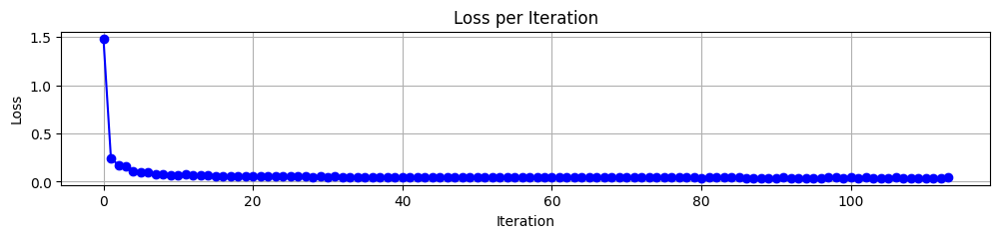

In [330]:
plt.figure(figsize=(12, 2))

# 반복 단위 손실 그래프
plt.plot(train_flatten, label='Train (per iter)', linestyle='-', marker='o', color='blue')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

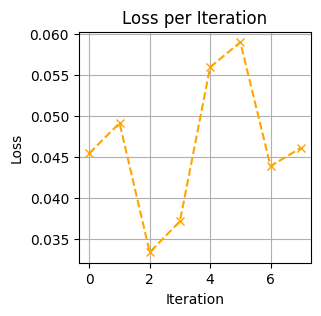

In [331]:
plt.plot(val_flatten, label='Validation (per iter)', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

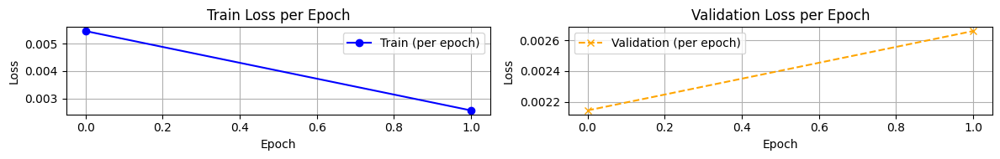

In [332]:
# 1행 2열 레이아웃 생성
fig, axes = plt.subplots(1, 2, figsize=(12, 2))  # 그래프 크기 조정

# Train loss per epoch 그래프
axes[0].plot(train_loss_per_epoch, label='Train (per epoch)', linestyle='-', marker='o', color='blue')
axes[0].set_title("Train Loss per Epoch")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid()
axes[0].legend()

# Validation loss per epoch 그래프
axes[1].plot(val_loss_per_epoch, label='Validation (per epoch)', linestyle='--', marker='x', color='orange')
axes[1].set_title("Validation Loss per Epoch")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Loss")
axes[1].grid()
axes[1].legend()

plt.tight_layout()
plt.show()

# 평가

In [333]:
!pwd

/root/code/unet/attention_spatial


In [334]:
%cd /root/code/unet/attention_spatial

/root/code/unet/attention_spatial


In [335]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

## batch size 16

### loss 추이 관찰

In [336]:
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNetWithSpatialAttention().to(device)
model.load_state_dict(torch.load('unet_S_A.pth'))

<All keys matched successfully>

In [337]:
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0)
len(test_loader)

6025

In [338]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf
from tqdm import tqdm  # tqdm을 올바르게 import

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating:  17%|█▋        | 1012/6025 [00:09<00:47, 106.03it/s]

train loss : 0.039930822697933764


Evaluating:  33%|███▎      | 2013/6025 [00:18<00:37, 106.16it/s]

train loss : 0.03696768591925502


Evaluating:  50%|█████     | 3014/6025 [00:28<00:28, 106.00it/s]

train loss : 0.03824651299137622


Evaluating:  67%|██████▋   | 4015/6025 [00:37<00:18, 107.70it/s]

train loss : 0.02784541284432635


Evaluating:  83%|████████▎ | 5016/6025 [00:46<00:09, 107.41it/s]

train loss : 0.027491123429033905


Evaluating: 100%|█████████▉| 6017/6025 [00:55<00:00, 107.61it/s]

train loss : 0.02557526180613786


Evaluating: 100%|██████████| 6025/6025 [00:56<00:00, 107.47it/s]


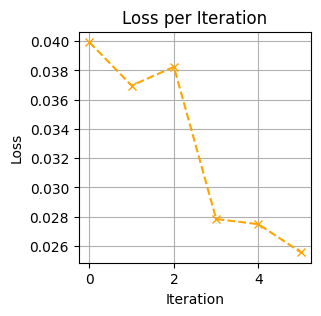

In [339]:
plt.plot(loss_list, label='Test', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

### 16개 개별비교

In [340]:
def visualize_patches_total(X, y, X_hat):

    fig, axes = plt.subplots(3, 16, figsize=(32, 6))  # 3행 16열로 설정
    fig.suptitle("Patches", fontsize=12, y=1.05)  # 전체 제목 추가

    for i in range(X.shape[0]):  # 16개의 이미지만큼 반복
        # X 데이터 시각화
        axes[0, i].imshow(X[i], cmap='gray', vmin=-200, vmax=300)
        axes[0, i].axis('off')
        axes[0, i].set_title(f"X {i+1}", fontsize=12)
        
        # y 데이터 시각화
        axes[1, i].imshow(y[i], cmap='gray', vmin=-200, vmax=300)
        axes[1, i].axis('off')
        axes[1, i].set_title(f"y {i+1}", fontsize=12)
        
        # X_hat 데이터 시각화
        axes[2, i].imshow(X_hat[i], cmap='gray', vmin=-200, vmax=300)
        axes[2, i].axis('off')
        axes[2, i].set_title(f"X_hat {i+1}", fontsize=12)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # 제목 위치 조정
    plt.show()


In [341]:
# 1. 랜덤비교

test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0)
test_iter = iter(test_loader)
len(test_iter)

6025

In [342]:
idx = 400 # 1~6025 여기 안에서 선택
for i in range(idx):
    X_test, y_test = next(test_iter)
    
X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(model(X_test.cuda()).cpu().detach()).numpy() * 500 - 500

In [343]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

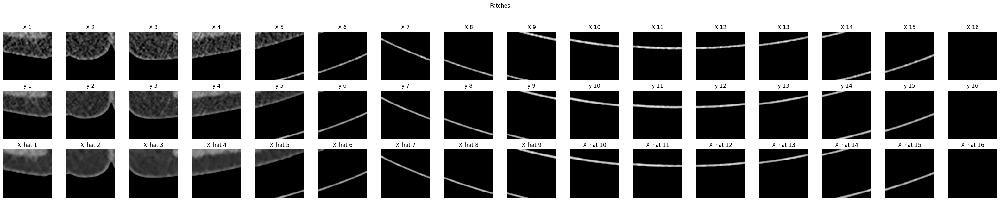

In [344]:
visualize_patches_total(X, y, X_hat)

In [345]:
# 2. 가장 loss가 낮은 값 확인

X_test,y_test,X_hat = best

X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(model(X_test.cuda()).cpu().detach()).numpy() * 500 - 500

In [346]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

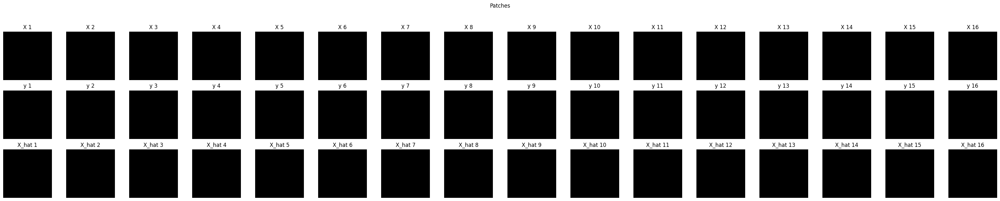

In [347]:
visualize_patches_total(X, y, X_hat)

In [348]:
# 3. 가장 loss가 높은 값 확인

X_test,y_test,X_hat = worst

X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(model(X_test.cuda()).cpu().detach()).numpy() * 500 - 500

In [349]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

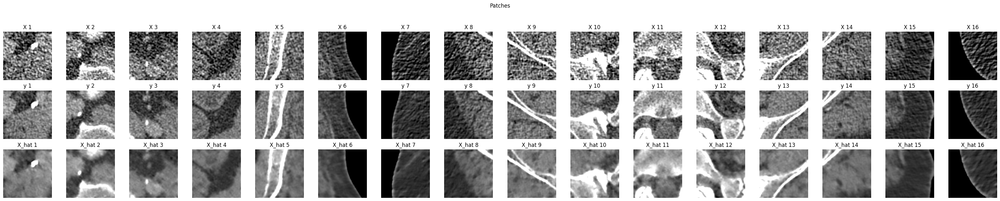

In [350]:
visualize_patches_total(X, y, X_hat)

## batch size = 81

In [351]:
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNetWithSpatialAttention().to(device)
model.load_state_dict(torch.load('unet_S_A.pth'))

<All keys matched successfully>

In [352]:
test_loader = DataLoader(test_dataset, batch_size=81, shuffle=False, num_workers=0)
len(test_loader)

1190

In [353]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating:  84%|████████▍ | 1002/1190 [00:42<00:07, 23.59it/s]

train loss : 0.17235638721997384


Evaluating: 100%|██████████| 1190/1190 [00:49<00:00, 23.81it/s]


### 함수정의

In [354]:
def reconstruct_image(prediction, num_patches_per_row=9, patch_size=55):
    # prediction: (81, 1, 55, 55) 크기의 torch 텐서
    num_patches = prediction.shape[0]  # 81개의 패치
    assert prediction.shape == (81, 1, 55, 55) # "패치의 크기가 올바르지 않습니다."
    
    # 최종적으로 1x495x495 크기의 이미지를 만들기 위한 초기화
    final_image = torch.zeros(1, num_patches_per_row * patch_size, num_patches_per_row * patch_size)
    
    # 9x9 배열로 패치 붙이기
    for i in range(num_patches):
        row = i // num_patches_per_row  # 현재 패치의 행 번호
        col = i % num_patches_per_row   # 현재 패치의 열 번호
        
        # 패치를 해당 위치에 붙이기
        final_image[:, 
                    row * patch_size:(row + 1) * patch_size, 
                    col * patch_size:(col + 1) * patch_size] = prediction[i, 0]

    return final_image

In [355]:
def extract_patches(img, patch_size=55, interval=55):
    patches = []
    _, height, width = img.shape
    for y in range(0, height - patch_size + 1, interval):
        for x in range(0, width - patch_size + 1, interval):
            patch = img[:, y:y + patch_size, x:x + patch_size]
            patches.append(patch)
    patches = torch.stack(patches)  # 리스트를 텐서로 변환
    return patches  # 반환 형태는 patch 수 x 1 x 55 x 55

In [356]:
def rescale(img):
    return img*500-500 # -1000부터 2000의 값으로 다시 변환

In [357]:
def trans_img(X):
    return rescale(np.squeeze(reconstruct_image(X)))

In [358]:
X_test,y_test,X_hat = best
trans_img(X_test).min(), trans_img(X_test).max()

(tensor(-1024.), tensor(1420.))

In [359]:
trans_img(X_test).shape

torch.Size([495, 495])

In [360]:
!pwd

/root/code/unet/attention_spatial


In [361]:
def save_img(X_test, X_hat, y_test, s):
    # X_test 저장
    numpy_X_test = trans_img(X_test).numpy()
    np.save(f'X_test_image{s}.npy', numpy_X_test)
    
    # X_hat 저장
    numpy_X_hat = trans_img(X_hat).numpy()
    np.save(f'X_hat_image{s}.npy', numpy_X_hat)
    
    # y_test 저장
    numpy_y_test = trans_img(y_test).numpy()
    np.save(f'y_test_image{s}.npy', numpy_y_test)

### 1. best

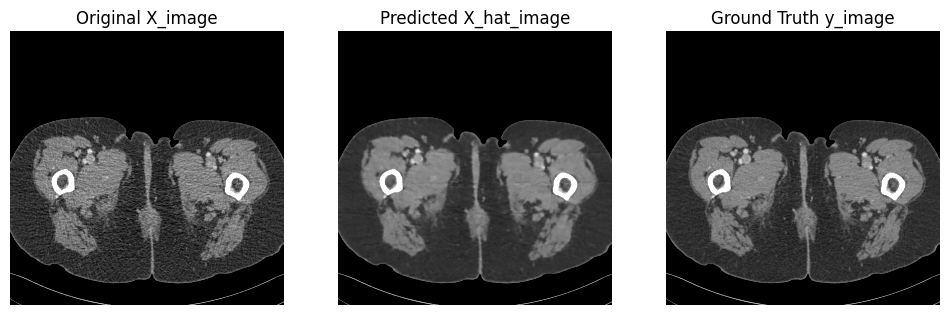

In [362]:
# 1. 가장 좋은 값 가져오기
X_test,y_test,X_hat = best

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(trans_img(X_hat), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(trans_img(y_test), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [363]:
# 이미지 저장

save_img(X_test, X_hat, y_test, 'best')

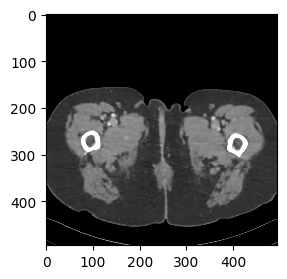

In [364]:
# 불러오기

import numpy as np

s = 'best'
X_test = np.load(f'X_hat_image{s}.npy')

plt.imshow(X_test, cmap='gray', vmin=-200, vmax=300)

### 2. worst

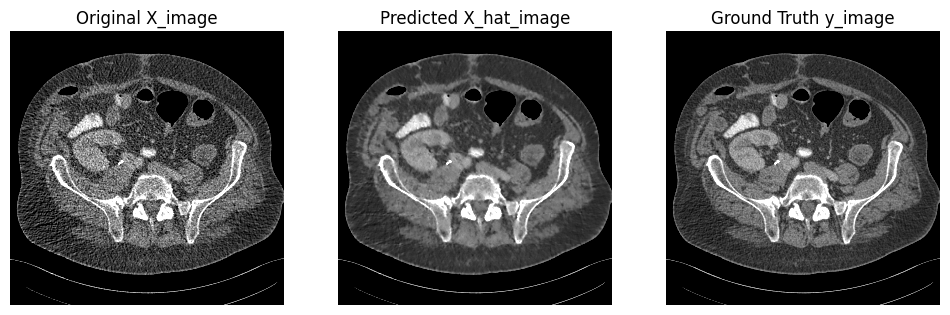

In [365]:
# 2. 가장 나쁜 값 가져오기
X_test,y_test,X_hat = worst

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(trans_img(X_hat), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(trans_img(y_test), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [366]:
# 이미지 저장

save_img(X_test, X_hat, y_test, 'worst')

### 3. 랜덤

In [367]:
import glob
# 3. 랜덤선택

i,j = 0,0
X_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[0]}/*.IMA'))[j]
y_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[1]}/*.IMA'))[j]

X_image, y_image = normlize(X_dir), normlize(y_dir)
X_patches = extract_patches(torch.from_numpy(X_image))

X_image.shape, y_image.shape, X_patches.shape

((1, 512, 512), (1, 512, 512), torch.Size([81, 1, 55, 55]))

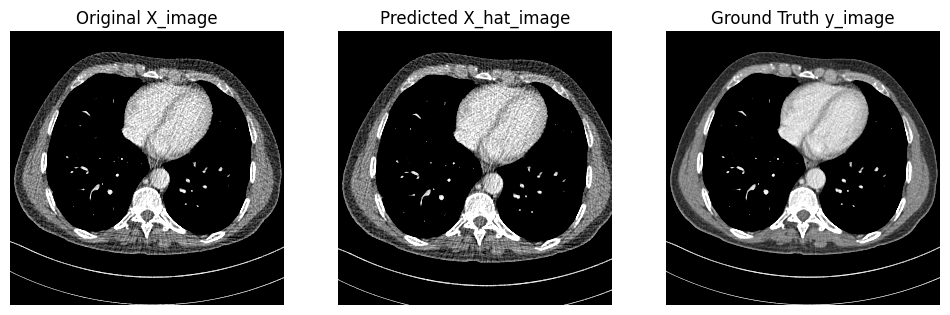

In [368]:
# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(rescale(np.squeeze(X_image)), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(rescale(np.squeeze(reconstruct_image(X_patches))), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(rescale(np.squeeze(y_image)), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [369]:
!pwd

/root/code/unet/attention_spatial


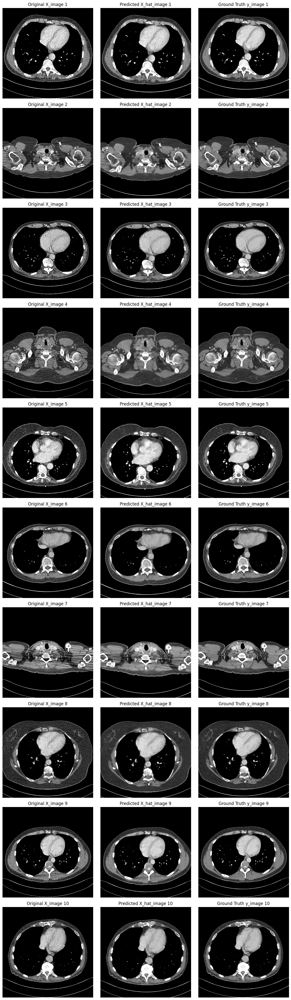

In [370]:
import matplotlib.pyplot as plt
import numpy as np

i, n = 0, 10
L = L_list[i]

# 전체 이미지 배열을 생성
fig, axes = plt.subplots(n, 3, figsize=(12, 4 * n))

for i in range(n):
    X_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[0]}/*.IMA'))[j]
    y_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[1]}/*.IMA'))[j]
    X_image, y_image = normlize(X_dir), normlize(y_dir)
    X_patches = extract_patches(torch.from_numpy(X_image))
    X_hat_patches = model(X_patches.cuda()).cpu().detach()
    reconstructed_image = reconstruct_image(X_hat_patches)

    # X_image 표시
    axes[i, 0].imshow(rescale(np.squeeze(X_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 0].set_title(f"Original X_image {i+1}")
    axes[i, 0].axis('off')

    # X_hat_image 표시
    axes[i, 1].imshow(rescale(np.squeeze(reconstructed_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 1].set_title(f"Predicted X_hat_image {i+1}")
    axes[i, 1].axis('off')

    # y_image 표시
    axes[i, 2].imshow(rescale(np.squeeze(y_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 2].set_title(f"Ground Truth y_image {i+1}")
    axes[i, 2].axis('off')

# 모든 이미지 저장
plt.tight_layout()
plt.savefig("comparison_images.png", format="png")  # 한번에 저장
plt.show()  # 모든 이미지 표시

# attention 확인

In [426]:
!pwd

/root/code/unet/attention_channel


In [427]:
%cd /root/code/unet/attention_spatial/

/root/code/unet/attention_spatial


In [428]:
# 모델 정의
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNetWithSpatialAttention().to(device)

# 저장된 가중치 로드
model.load_state_dict(torch.load('unet_S_A.pth'))
model.eval()

UNetWithSpatialAttention(
  (encoder): ModuleList(
    (0): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

## best / worst 이미지의 attention 확인

### 함수정의

In [429]:
def reconstruct_image(prediction, num_patches_per_row=9, patch_size=55):
    # prediction: (81, 1, 55, 55) 크기의 torch 텐서
    num_patches = prediction.shape[0]  # 81개의 패치
    
    # 최종적으로 1x495x495 크기의 이미지를 만들기 위한 초기화
    final_image = torch.zeros(1, num_patches_per_row * patch_size, num_patches_per_row * patch_size)
    
    # 9x9 배열로 패치 붙이기
    for i in range(num_patches):
        row = i // num_patches_per_row  # 현재 패치의 행 번호
        col = i % num_patches_per_row   # 현재 패치의 열 번호
        
        # 패치를 해당 위치에 붙이기
        final_image[:, 
                    row * patch_size:(row + 1) * patch_size, 
                    col * patch_size:(col + 1) * patch_size] = prediction[i, 0]

    return final_image

In [430]:
def extract_patches(img, patch_size=55, interval=55):
    patches = []
    _, height, width = img.shape
    for y in range(0, height - patch_size + 1, interval):
        for x in range(0, width - patch_size + 1, interval):
            patch = img[:, y:y + patch_size, x:x + patch_size]
            patches.append(patch)
    patches = torch.stack(patches)  # 리스트를 텐서로 변환
    return patches  # 반환 형태는 patch 수 x 1 x 55 x 55

In [431]:
def rescale(img):
    return img*500-500 # -1000부터 2000의 값으로 다시 변환

In [432]:
def trans_img(X):
    return rescale(np.squeeze(reconstruct_image(X)))

### 1. best

In [433]:
X_test,y_test,X_hat = best
X_test.shape

torch.Size([81, 1, 55, 55])

In [434]:
X_test.to(device)
output = model(X_test)

In [435]:
# Forward Pass
output = model(X_test)

att_matrix3 = model.attention_blocks[1].last_attention
att_matrix5 = model.attention_blocks[3].last_attention

att_matrix3.shape, att_matrix5.shape

(torch.Size([81, 1, 27, 27]), torch.Size([81, 1, 6, 6]))

In [436]:
att_matrix3.max(), att_matrix3.min()

(tensor(0.9976, device='cuda:0', grad_fn=<MaxBackward1>),
 tensor(0.2359, device='cuda:0', grad_fn=<MinBackward1>))

In [437]:
att_matrix5.max(), att_matrix5.min()

(tensor(0.9468, device='cuda:0', grad_fn=<MaxBackward1>),
 tensor(0.2803, device='cuda:0', grad_fn=<MinBackward1>))

In [438]:
from decimal import Decimal

# attention2의 mean과 sd 계산
mean3 = Decimal(str(np.mean(att_matrix3.cpu().detach().numpy()))).quantize(Decimal('0.001'))
sd3 = Decimal(str(np.sqrt(np.var(att_matrix3.cpu().detach().numpy())))).quantize(Decimal('0.001'))

# attention3의 mean과 sd 계산
mean5 = Decimal(str(np.mean(att_matrix5.cpu().detach().numpy()))).quantize(Decimal('0.001'))
sd5 = Decimal(str(np.sqrt(np.var(att_matrix5.cpu().detach().numpy())))).quantize(Decimal('0.001'))

# 출력
print(f"Attention 2 - mean: {mean3}, sd: {sd3}")
print(f"Attention 3 - mean: {mean5}, sd: {sd5}")

Attention 2 - mean: 0.704, sd: 0.074
Attention 3 - mean: 0.670, sd: 0.133


In [439]:
att_matrix3_img = reconstruct_image(prediction=att_matrix3, patch_size=att_matrix3.shape[-1])
att_matrix5_img = reconstruct_image(prediction=att_matrix5, patch_size=att_matrix5.shape[-1])

att_matrix3_img.shape, att_matrix5_img.shape

(torch.Size([1, 243, 243]), torch.Size([1, 54, 54]))

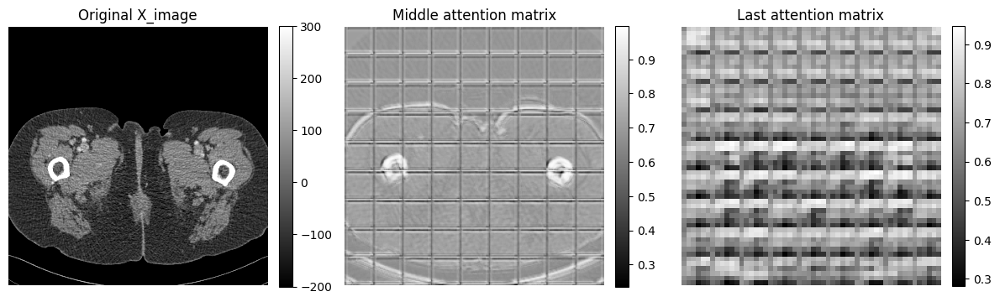

In [441]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# 첫 번째 이미지
im0 = axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')
fig.colorbar(im0, ax=axes[0], orientation='vertical', fraction=0.046, pad=0.04)

# 두 번째 이미지
im1 = axes[1].imshow(np.squeeze(att_matrix3_img.detach().cpu().numpy()), cmap='gray')
axes[1].set_title("Middle attention matrix")
axes[1].axis('off')
fig.colorbar(im1, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

# 세 번째 이미지
im2 = axes[2].imshow(np.squeeze(att_matrix5_img.detach().cpu().numpy()), cmap='gray')
axes[2].set_title("Last attention matrix")
axes[2].axis('off')
fig.colorbar(im2, ax=axes[2], orientation='vertical', fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

### 2. worst

In [384]:
X_test,y_test,X_hat = worst
X_test.shape

torch.Size([81, 1, 55, 55])

In [385]:
X_test.to(device)
output = model(X_test)

In [386]:
# Forward Pass
output = model(X_test)

att_matrix3 = model.attention_blocks[1].last_attention
att_matrix5 = model.attention_blocks[3].last_attention

att_matrix3.shape, att_matrix5.shape

(torch.Size([81, 1, 27, 27]), torch.Size([81, 1, 6, 6]))

In [387]:
att_matrix3.max(), att_matrix3.min()

(tensor(0.9911, device='cuda:0', grad_fn=<MaxBackward1>),
 tensor(0.2859, device='cuda:0', grad_fn=<MinBackward1>))

In [388]:
att_matrix5.max(), att_matrix5.min()

(tensor(0.9810, device='cuda:0', grad_fn=<MaxBackward1>),
 tensor(0.2491, device='cuda:0', grad_fn=<MinBackward1>))

In [389]:
from decimal import Decimal

# attention2의 mean과 sd 계산
mean3 = Decimal(str(np.mean(att_matrix3.cpu().detach().numpy()))).quantize(Decimal('0.001'))
sd3 = Decimal(str(np.sqrt(np.var(att_matrix3.cpu().detach().numpy())))).quantize(Decimal('0.001'))

# attention3의 mean과 sd 계산
mean5 = Decimal(str(np.mean(att_matrix5.cpu().detach().numpy()))).quantize(Decimal('0.001'))
sd5 = Decimal(str(np.sqrt(np.var(att_matrix5.cpu().detach().numpy())))).quantize(Decimal('0.001'))

# 출력
print(f"Attention 2 - mean: {mean3}, sd: {sd3}")
print(f"Attention 3 - mean: {mean5}, sd: {sd5}")

Attention 2 - mean: 0.708, sd: 0.079
Attention 3 - mean: 0.658, sd: 0.135


In [390]:
att_matrix3_img = reconstruct_image(prediction=att_matrix3, patch_size=att_matrix3.shape[-1])
att_matrix5_img = reconstruct_image(prediction=att_matrix5, patch_size=att_matrix5.shape[-1])

att_matrix3_img.shape, att_matrix5_img.shape

(torch.Size([1, 243, 243]), torch.Size([1, 54, 54]))

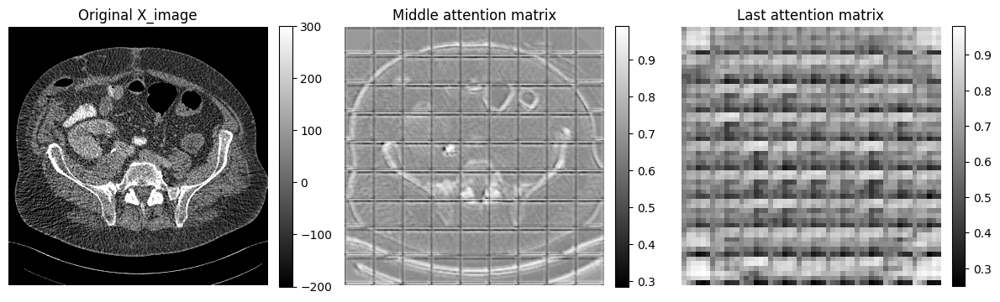

In [391]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# 첫 번째 이미지
im0 = axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')
fig.colorbar(im0, ax=axes[0], orientation='vertical', fraction=0.046, pad=0.04)

# 두 번째 이미지
im1 = axes[1].imshow(np.squeeze(att_matrix3_img.detach().cpu().numpy()), cmap='gray')
axes[1].set_title("Middle attention matrix")
axes[1].axis('off')
fig.colorbar(im1, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

# 세 번째 이미지
im2 = axes[2].imshow(np.squeeze(att_matrix5_img.detach().cpu().numpy()), cmap='gray')
axes[2].set_title("Last attention matrix")
axes[2].axis('off')
fig.colorbar(im2, ax=axes[2], orientation='vertical', fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

## 결론??
잘나올수록 attention이 마지막 layer에서 더 차등이 크다. 그러니까 마지막 layer에서 attention이 더 효과가 있을수록 좋은 성능을 보인 것이다.